<a href="https://colab.research.google.com/github/PrabhatRajput001/Netflix-Movies-and-TV-shows-clustering/blob/main/Copy_of_Netflix_movie_and_TV_show_Clustering(1).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ***Project Name*** --- Netflix movie and TV show Clustering

##### **Project Type - Unsupervised Learning**
##### **Contribution - Individual**
##### **Name - Prabhat Rajput**

# **Github link-**

https://github.com/PrabhatRajput001/Netflix-Movies-and-TV-shows-clustering

# **Project Summary -**

In order to identify trends and compile related things into groups, our research analyzed a Netflix dataset. The collection included statistics on countries, genres, actors, and directors in movies.

Here is how we methodically went about the project:

* Data cleaning: To clean the dataset, we added missing values, got rid of pointless columns, and changed category variables into numerical values. We also de-duplicated text and cut it up into smaller bits after processing the text data.

* Feature Extraction: To convert the textual information into numerical data, we employed a method called TF-IDF. This made it easier for us to cluster text in a useful way.

* Dimensionality reduction: We used Principal Component Analysis (PCA) to decompose the data into smaller, more manageable pieces.This process assisted us in efficiently grouping and visualizing the data.

* Selecting Clustering Techniques: We experimented with a variety of clustering methods, including K-means and agglomerative clustering. To find the ideal number of clusters and the ideal parameters for the clustering methods, we employed evaluation metrics including the Davies-Bouldin Score, Calinski-Harabasz Score, and Silhouette Score.

  Scattered plots, word clouds, and three-dimensional plots were all made to depict the groupings. We were able to better comprehend the traits and distribution of the clusters thanks to these visuals.

* Evaluation: Using criteria such as the silhouette score, Calinski-Harabasz score, and Davies-Bouldin score, we evaluated the quality of the clusters. These metrics revealed the degree of cluster separation, the degree of cluster compactness, and the degree of similarity between the components of each cluster.

  Overall, the Netflix cluster project revealed hidden patterns and grouped related objects, giving important insights into the dataset. It made it possible to classify information and make customised recommendations. We need to further investigate techniques, parameters, and features for data-driven decision-making in the entertainment business in order to improve the clustering.


# **Problem Statement**


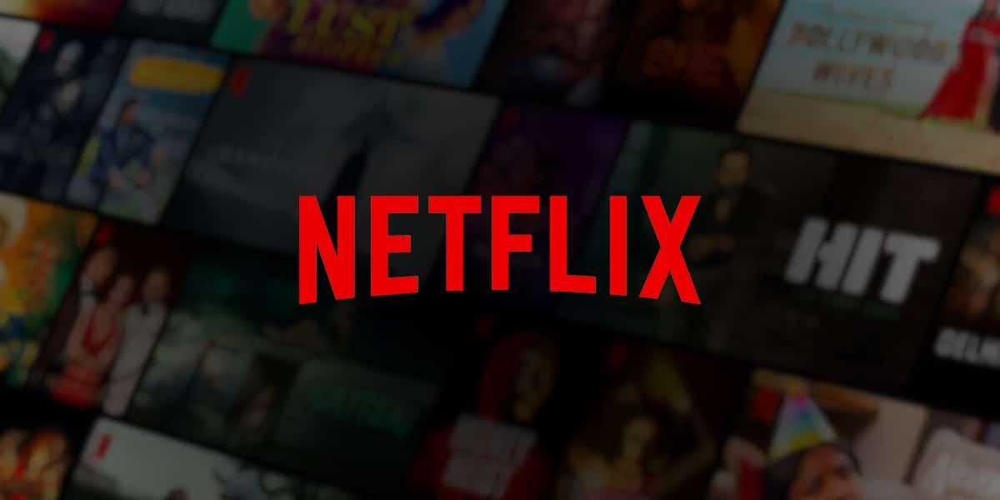

The task is to do cluster analysis on a Netflix dataset to find trends and group related things together. The dataset includes numerous information such as descriptions, actors, directors, kind, and nations, among others. The objective is to discover movie clusters based on these characteristics, enabling personalised recommendations, targeted marketing, and content classification. The research seeks to give useful insights about movie linkages and to allow data-driven decision-making in the field of entertainment.


## **Import Libraries**

In [ ]:
import missingno as msno
import plotly as px
from sklearn.decomposition import PCA
import plotly.graph_objects as go
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from sklearn.metrics import silhouette_score
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as shc
import missingno as miss
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
import nltk
from nltk.tokenize import word_tokenize
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('stopwords')
from nltk.corpus import wordnet
from nltk.stem import WordNetLemmatizer
nltk.download('averaged_perceptron_tagger')
from nltk.corpus import stopwords
from nltk.stem.snowball import SnowballStemmer
import string
from os import path
from PIL import Image
from collections import Counter
from datetime import datetime
from yellowbrick.cluster import KElbowVisualizer

# Data Manipulation Libraries
import numpy as np
import pandas as pd
import datetime as dt

# Data Visualization Libraries
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import warnings

# Ignore all warnings
warnings.filterwarnings("ignore")


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


## **Load dataset**

### ***Dataset Mounting***

In [ ]:
# drive mounting
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# load the dataset
dataset_path = ('/content/drive/MyDrive/AlmaBetter/Netflix Movies and TV shows clustering/Netflix Dataset/NETFLIX MOVIES AND TV SHOWS CLUSTERING (1).csv')
df = pd.read_csv(dataset_path)

### **First look of the dataset**

In [ ]:
df.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,TV Show,3%,NaN,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow..."
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi..."
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...


### Dataset Rows & Columns count

In [ ]:
# Dataset Rows & Columns count
print(f"Rows and Column count in the Dataset: Rows= {df.shape[0]}, Columns= {df.shape[1]}")

Rows and Column count in the Dataset: Rows= 7787, Columns= 12


### Dataset Information

In [ ]:
# Information about the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7787 entries, 0 to 7786
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   show_id       7787 non-null   object
 1   type          7787 non-null   object
 2   title         7787 non-null   object
 3   director      5398 non-null   object
 4   cast          7069 non-null   object
 5   country       7280 non-null   object
 6   date_added    7777 non-null   object
 7   release_year  7787 non-null   int64 
 8   rating        7780 non-null   object
 9   duration      7787 non-null   object
 10  listed_in     7787 non-null   object
 11  description   7787 non-null   object
dtypes: int64(1), object(11)
memory usage: 730.2+ KB


***In the information chart we see that besides release_year, all the columns are categorical.***

### Duplicated Values

In [ ]:
# Check the duplicated value in the dataset
df.duplicated().sum()

0

***We have no duplicate values in the dataset***

### Check the null values in the dataset

In [ ]:
# check the null value in dataset
df.isnull().sum()

show_id            0
type               0
title              0
director        2389
cast             718
country          507
date_added        10
release_year       0
rating             7
duration           0
listed_in          0
description        0
dtype: int64

In [ ]:
# Null values percentage in each variable of the dataset
for x in df.columns:
  null_percentage = df[x].isnull().sum()/len(df)
  print(f'In {x} null value percentage is {null_percentage:.2f}%' )
  print(' '*500)


In show_id null value percentage is 0.00%
                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
In type null value percentage is 0.00%
                                                                                                                                                                                                                                                                                                                                                                                                                                  

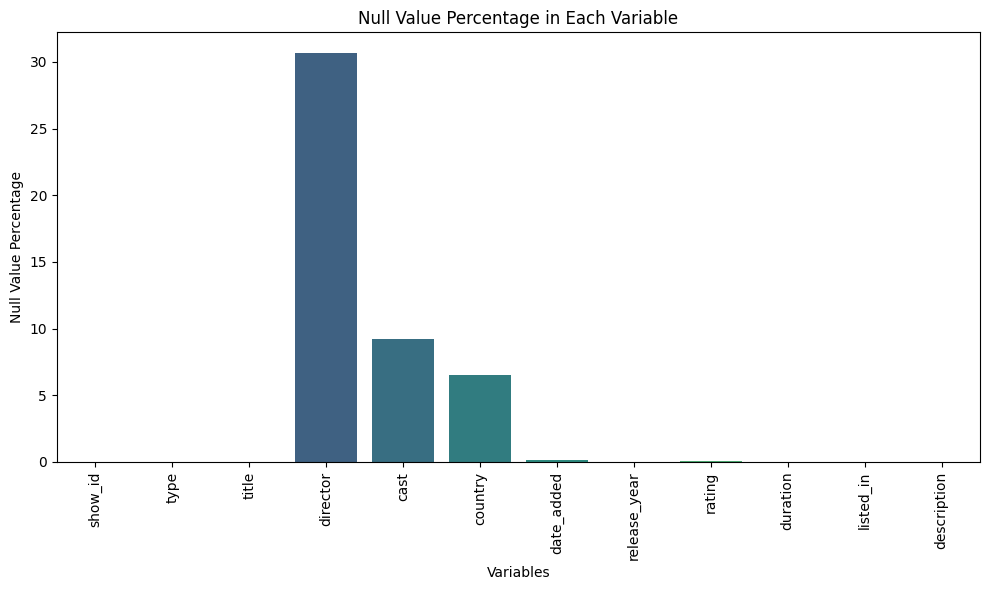

In [ ]:
# Calculate null value percentages for each variable
null_percentages = (df.isnull().sum() / len(df)) * 100

# Create a count plot
plt.figure(figsize=(10,6))
sns.barplot(x=null_percentages.index, y=null_percentages.values, palette='viridis')
plt.xticks(rotation=90)  # Rotates x-axis labels for better readability
plt.xlabel('Variables')
plt.ylabel('Null Value Percentage')
plt.title('Null Value Percentage in Each Variable')
plt.tight_layout()  # Ensures the plot fits nicely in the figure
plt.show()

### What did you know about your dataset?

There are 12 columns total in the Netflix Movies and TV Shows Clustering Dataset, however only one of them has an integer data type. There are no duplicate values in the dataset. Five columns, however, director, cast, nation, date_added, and rating, all have null values.

This dataset can be used for constructing clustering models to group similar titles together based on shared characteristics like genre, place of origin, and rating as well as for exploring patterns in the kinds of movies and TV episodes that are accessible on Netflix.


### ***2. Understanding Your Variables***

In [ ]:
# columns name of the dataset
df.columns

Index(['show_id', 'type', 'title', 'director', 'cast', 'country', 'date_added',
       'release_year', 'rating', 'duration', 'listed_in', 'description'],
      dtype='object')

In [ ]:
# Dataset Describe
df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
show_id,7787,7787,s1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
type,7787,2,Movie,5377,NaN,NaN,NaN,NaN,NaN,NaN,NaN
title,7787,7787,3%,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
director,5398,4049,"Raúl Campos, Jan Suter",18,NaN,NaN,NaN,NaN,NaN,NaN,NaN
cast,7069,6831,David Attenborough,18,NaN,NaN,NaN,NaN,NaN,NaN,NaN
country,7280,681,United States,2555,NaN,NaN,NaN,NaN,NaN,NaN,NaN
date_added,7777,1565,"January 1, 2020",118,NaN,NaN,NaN,NaN,NaN,NaN,NaN
release_year,7787.0,NaN,NaN,NaN,2013.93258,8.757395,1925.0,2013.0,2017.0,2018.0,2021.0
rating,7780,14,TV-MA,2863,NaN,NaN,NaN,NaN,NaN,NaN,NaN
duration,7787,216,1 Season,1608,NaN,NaN,NaN,NaN,NaN,NaN,NaN


#### **Variables Description**

1. show_id : Unique ID for every Movie / Tv Show
2. type : Identifier - A Movie or TV Show
3. title : Title of the Movie / Tv Show
4. director : Director of the Movie
5. cast : Actors involved in the movie / show
6. country : Country where the movie / show was produced
7. date_added : Date it was added on Netflix
8. release_year : Actual Releaseyear of the movie / show
9. rating : TV Rating of the movie / show
10. duration : Total Duration - in minutes or number of seasons
11. listed_in : Genre
12. description: The Summary description

In [ ]:
for column in df.columns:
    unique_values = df[column].nunique()
    print(f'Unique values in {column} are {unique_values}.')


Unique values in show_id are 7787.
Unique values in type are 2.
Unique values in title are 7787.
Unique values in director are 4049.
Unique values in cast are 6831.
Unique values in country are 681.
Unique values in date_added are 1565.
Unique values in release_year are 73.
Unique values in rating are 14.
Unique values in duration are 216.
Unique values in listed_in are 492.
Unique values in description are 7769.


###  ***3. Data Wrangling***

#### **Make a copy of the original dataset**

In [ ]:
df1 = df.copy()

We make a copy of the original dataset beacause it avoid the changes in original dataset.

In [ ]:
df1.shape

(7787, 12)

In [ ]:
# Let's tackle the missing values.

# Number of null values in date_added.
df.date_added.isnull().sum()

10

In [ ]:
# Remove null values in date_added.
df.dropna(subset=['date_added'], inplace=True)

In [ ]:
# Number of null values in rating.
df.rating.isnull().sum()
# Remove null values in rating.
df.dropna(subset=['rating'], inplace=True)

In [ ]:
# New Shape of the dataset
df.shape

(7770, 12)

**Handling missing data in the director, cast, and country columns**

In [ ]:
df[['director','cast','country']] = df[['director','cast','country']].fillna('Unknown')
df.dropna(axis=0, inplace = True)

In [ ]:
# Again check the missing values
df.isna().sum()

show_id         0
type            0
title           0
director        0
cast            0
country         0
date_added      0
release_year    0
rating          0
duration        0
listed_in       0
description     0
dtype: int64

In [ ]:
# make a new copy of this clean dataset
df2 = df.copy()

***Now we have no missing values in the dataset.***

##### What all manipulations have you done and insights you found?

First, we removed null values from the date_added and rating columns.Then,in the columns director, cast, and nation null values were replaced by 'unknown'. The dataset now contains no missing values.

#### **2.  Handling nested columns i.e 'director', 'cast', 'listed_in' and 'country'**

In [ ]:
# Unnest 'director', 'cast', 'listed_in', and 'country' columns
df['director'] = df['director'].str.split(', ')
df['cast'] = df['cast'].str.split(', ')
df['listed_in'] = df['listed_in'].str.split(', ')
df['country'] = df['country'].str.split(', ')

# Create separate dataframes for each unnested column
df_directors = df.explode('director')[['title', 'director']]
df_cast = df.explode('cast')[['title', 'cast']]
df_genre = df.explode('listed_in')[['title', 'listed_in']]
df_country = df.explode('country')[['title', 'country']]

# Merge all the separate dataframes
df_merged = df_directors.merge(df_cast, on='title').merge(df_genre, on='title').merge(df_country, on='title')

# Handle 'duration' column separately
df['duration'] = df['duration'].str.split().str[0]  # Remove 'min' or 'season' from the end
df['duration'] = df['duration'].astype(int)  # Typecast to integer


In [ ]:
# Merging unnested data with the created dataframe in order to make the final dataframe
df = df_merged.merge(df[['type', 'title', 'date_added', 'release_year', 'rating', 'duration','description']],on=['title'],how='left')
df.head(55)

,title,director,cast,listed_in,country,type,date_added,release_year,rating,duration,description
0,3%,Unknown,João Miguel,International TV Shows,Brazil,TV Show,"August 14, 2020",2020,TV-MA,4,In a future where the elite inhabit an island ...
1,3%,Unknown,João Miguel,TV Dramas,Brazil,TV Show,"August 14, 2020",2020,TV-MA,4,In a future where the elite inhabit an island ...
2,3%,Unknown,João Miguel,TV Sci-Fi & Fantasy,Brazil,TV Show,"August 14, 2020",2020,TV-MA,4,In a future where the elite inhabit an island ...
3,3%,Unknown,Bianca Comparato,International TV Shows,Brazil,TV Show,"August 14, 2020",2020,TV-MA,4,In a future where the elite inhabit an island ...
4,3%,Unknown,Bianca Comparato,TV Dramas,Brazil,TV Show,"August 14, 2020",2020,TV-MA,4,In a future where the elite inhabit an island ...
5,3%,Unknown,Bianca Comparato,TV Sci-Fi & Fantasy,Brazil,TV Show,"August 14, 2020",2020,TV-MA,4,In a future where the elite inhabit an island ...
6,3%,Unknown,Michel Gomes,International TV Shows,Brazil,TV Show,"August 14, 2020",2020,TV-MA,4,In a future where the elite inhabit an island ...
7,3%,Unknown,Michel Gomes,TV Dramas,Brazil,TV Show,"August 14, 2020",2020,TV-MA,4,In a future where the elite inhabit an island ...
8,3%,Unknown,Michel Gomes,TV Sci-Fi & Fantasy,Brazil,TV Show,"August 14, 2020",2020,TV-MA,4,In a future where the elite inhabit an island ...
9,3%,Unknown,Rodolfo Valente,International TV Shows,Brazil,TV Show,"August 14, 2020",2020,TV-MA,4,In a future where the elite inhabit an island ...


In [ ]:
df.shape

(175807, 11)

#### **3. Typecasting of attributes**

In [ ]:
# Checking info of the dataset before typecasting
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 175807 entries, 0 to 175806
Data columns (total 11 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   title         175807 non-null  object
 1   director      175807 non-null  object
 2   cast          175807 non-null  object
 3   listed_in     175807 non-null  object
 4   country       175807 non-null  object
 5   type          175807 non-null  object
 6   date_added    175807 non-null  object
 7   release_year  175807 non-null  int64 
 8   rating        175807 non-null  object
 9   duration      175807 non-null  int64 
 10  description   175807 non-null  object
dtypes: int64(2), object(9)
memory usage: 16.1+ MB


In [ ]:
# Typecasting string object to datetime object of date_added column
df['date_added']= pd.to_datetime(df['date_added'])

# Extracting date, day, month and year from date_added column
df["day_added"]= df["date_added"].dt.day
df["month_added"]= df["date_added"].dt.month
df["year_added"]= df["date_added"].dt.year

# Dropping date_added
df.drop('date_added', axis=1, inplace=True)

In [ ]:
# Checking info of the dataset after typecasting
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 175807 entries, 0 to 175806
Data columns (total 13 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   title         175807 non-null  object
 1   director      175807 non-null  object
 2   cast          175807 non-null  object
 3   listed_in     175807 non-null  object
 4   country       175807 non-null  object
 5   type          175807 non-null  object
 6   release_year  175807 non-null  int64 
 7   rating        175807 non-null  object
 8   duration      175807 non-null  int64 
 9   description   175807 non-null  object
 10  day_added     175807 non-null  int64 
 11  month_added   175807 non-null  int64 
 12  year_added    175807 non-null  int64 
dtypes: int64(5), object(8)
memory usage: 18.8+ MB


**Now we have no duplicated or null values in the data set.**

####  **4. Binning of Rating attribute**

Different categories that determine whether a show or movie is appropriate for certain age groups can be found in the rating column. Let's categorize and reduce them as follows:

**For Adults:** Programs or films with language, violence, or sexually explicit material that are intended for mature audiences. Ratings like TV-MA, NC-17, and R fall under this category.

**For Children:** Material designed with young viewers in mind, frequently free of coarse language or violent content. Ratings like TV-PG, PG, TV-G, and G fall under this category.

**For Teens:** Films or TV shows with mature themes that are suitable for teenagers. This contains PG-13 and TV-14 ratings.

**Family-friendly:** media is suited for children and families and has little to no unpleasant content. Ratings like TV-Y, TV-Y7, and TV-Y7-FV fall within this category.


**Not Rated:** Material that has not been formally assigned a rating by a rating body and may include unpredictable or potentially inappropriate content. Here, NR and UR are included.

This method of categorizing ratings makes it simpler to comprehend and classify content according to its suitability for various audiences.

* **Adult Content**: TV-MA, NC-17, R
* **Children Content**:  TV-PG, PG, TV-G, G
* **Teen Content**: PG-13, TV-14
* **Family-friendly Content**: TV-Y, TV-Y7, TV-Y7-FV
* **Not Rated**: NR, UR



In [ ]:
def categorize_rating(rating):
    if rating in ('TV-MA', 'R', 'NC-17'):
        return 'Adult Content'
    elif rating in ('TV-PG', 'PG', 'TV-G', 'G'):
        return 'Children Content'
    elif rating in ('PG-13', 'TV-14'):
        return 'Teen Content'
    elif rating in ('TV-Y', 'TV-Y7', 'TV-Y7-FV'):
        return 'Family-friendly Content'
    else:
        return 'Not Rated'

# Apply the categorize_rating function to create a new 'category' column
df['category'] = df['rating'].apply(categorize_rating)

# Drop the original 'rating' column if needed
df.drop(columns=['rating'], axis=1, inplace=True)




In [ ]:
df.shape

(175807, 13)

### ***4. Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables***

#### **Type: Movie and TV Shows**

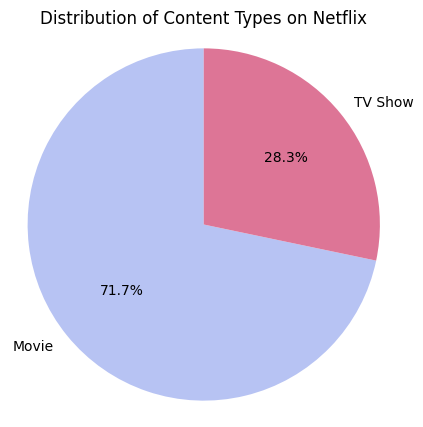

In [ ]:
# Create a DataFrame of the count of each unique value in the 'type' column
type_counts = df['type'].value_counts()

# Create a pie chart of the 'type' column
plt.figure(figsize=(5,5))
plt.pie(type_counts, labels=type_counts.index, colors=['#B7C3F3', '#DD7596'], autopct='%1.1f%%', startangle=90)
plt.title('Distribution of Content Types on Netflix')
plt.axis('equal')
plt.show()

##### 1. Why did you pick the specific chart?

The pie chart you've created effectively visualizes the percentage of TV shows and movies in the Netflix dataset.

##### 2. What is/are the insight(s) found from the chart?


We can see that the majority of the content on Netflix is movies, which account for around two-thirds of the total content. TV shows make up the remaining one-third of the content.

we can conclude that in the given Data set only 28.3% are TV Shows and 71.7% are Movies.

#### 2. Content rating:

In [ ]:
# Separating the dataframes for movies and TV shows
df_movies = df[df['type'] == 'Movie']
df_tvshows = df[df['type'] == 'TV Show']

# Printing the shape
print(df_movies.shape, df_tvshows.shape)

(126079, 13) (49728, 13)


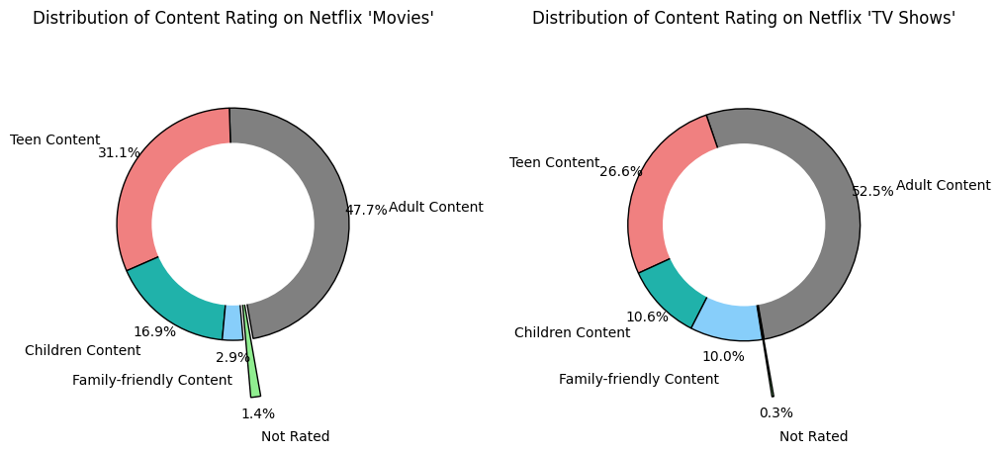

In [ ]:
# Create a list of dataframes and labels
dataframes = [df_movies, df_tvshows]
labels = ['Movies', 'TV Shows']

# Calculate the number of subplots dynamically
num_plots = len(dataframes)

for i in range(num_plots):
    plt.subplot(1, num_plots, i + 1)
    count = dataframes[i]['category'].value_counts()
    colors = ['grey', 'lightcoral', 'lightseagreen', 'lightskyblue', 'lightgreen']
    explode = (0, 0, 0, 0, 0.5)
    wedgeprops = {'edgecolor': 'black', 'linewidth': 1, 'antialiased': True}
    plt.pie(count, labels=count.index, colors=colors, autopct='%1.1f%%', labeldistance=1.35,
            startangle=280, pctdistance=1.15, explode=explode, wedgeprops=wedgeprops)
    circle = plt.Circle((0, 0), 0.70, fc='white')
    fig = plt.gcf()
    fig.gca().add_artist(circle)
    plt.title(f"Distribution of Content Rating on Netflix '{labels[i]}'", y=1.08)
    plt.axis('equal')

plt.gcf().set_size_inches(10, 5)
# Add spacing between subplots
plt.subplots_adjust(wspace=1)

plt.show()


##### **1. Why did you pick the specific chart?**

We chosen this chart to know the percentage of type of content present in the Netflix.

##### 2. **What is/are the insight(s) found from the chart?**


1.We found that most of the content present in the Netflix belongs to Adult and the teen categories.

2.Another important insight we can see that **Family friendly content** less in Movies compared to TV Shows.

##### **3. Will the gained insights help creating a positive business impact?**
Are there any insights that lead to negative growth? Justify with specific reason.

#### **Chart - 3** (Who are the top actors performing in Movies and TV Shows?)

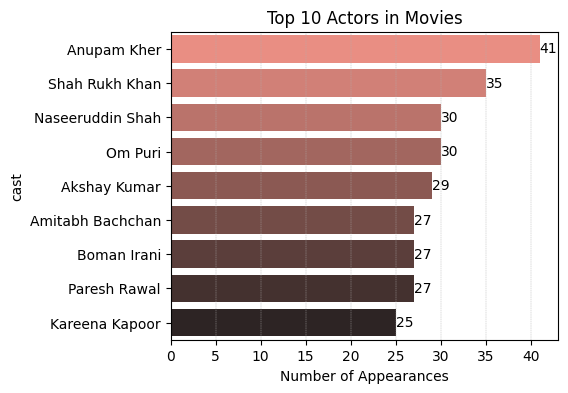

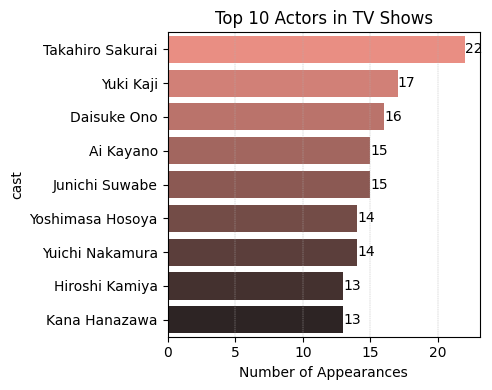

In [ ]:
for i in range(len(dataframes)):
    plt.figure(figsize = (5,4))
    df_actor = dataframes[i].groupby(['cast']).agg({'title': 'nunique'}).reset_index().sort_values(by=['title'], ascending=False)[1:10]
    plots = sns.barplot(x="title", y="cast", data=df_actor, orient='h', palette="dark:salmon_r")
    plt.title(f'Top 10 Actors in {labels[i]}')
    plt.xlabel('Number of Appearances')
    plt.grid(axis='x', linestyle='--', linewidth=0.3)
    for container in plots.containers:
        plots.bar_label(container, fmt='%d')

# Adjust spacing between subplots
plt.tight_layout()
plt.show()

##### **1. Why did you pick the specific chart?**
To know which actors are more popular on Netflix.


##### **2. What is/are the insight(s) found from the chart?**
1. We found an interesting insight that **most of the Actors in Movies are from INDIA.**

2. No popular actors from india in TV Shows.

#### **Chart - 4 (Who are the top Directors directing Movies and TV Shows?)**

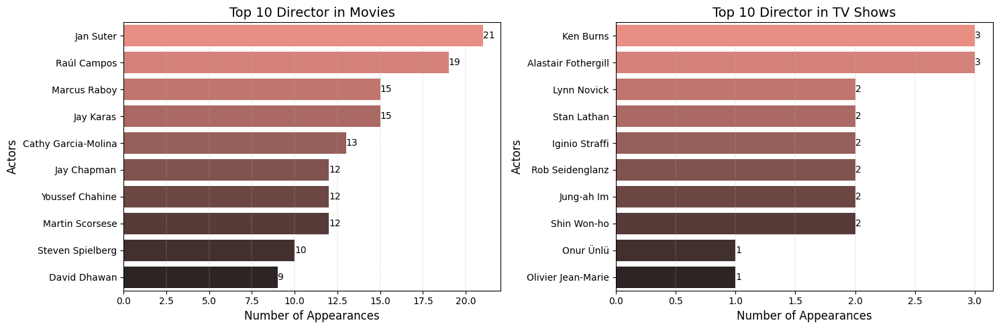

In [ ]:
plt.style.use('default')
plt.figure(figsize=(15, 5))

# Create a list of dataframes and labels
dataframes = [df_movies, df_tvshows]
labels = ['Movies', 'TV Shows']

for i in range(len(dataframes)):
    plt.subplot(1, len(dataframes), i + 1)
    df_actor = dataframes[i].groupby(['director']).agg({'title': 'nunique'}).reset_index().sort_values(by=['title'], ascending=False)[1:11]
    plots = sns.barplot(x="title", y="director", data=df_actor, palette="dark:salmon_r", orient='h')
    plt.title(f'Top 10 Director in {labels[i]}', fontsize=14)
    plt.xlabel('Number of Appearances', fontsize=12)
    plt.ylabel('Actors', fontsize=12)
    plt.grid(axis='x', linestyle='--', linewidth=0.3)
    for container in plots.containers:
        plots.bar_label(container, fmt='%d', fontsize=10)

# Adjust spacing between subplots
plt.tight_layout()
plt.show()


##### **1. Why did you pick the specific chart?**
To know which director is popular in Movies and which one is popular in TV Shows.

##### **2. What is/are the insight(s) found from the chart?**
1. We found that most of the movies directed by **jan suter**.

2. Most TV shows directed by **ken burns**.

#### **Chart - 5  (Visualize top 10 movies release country)**

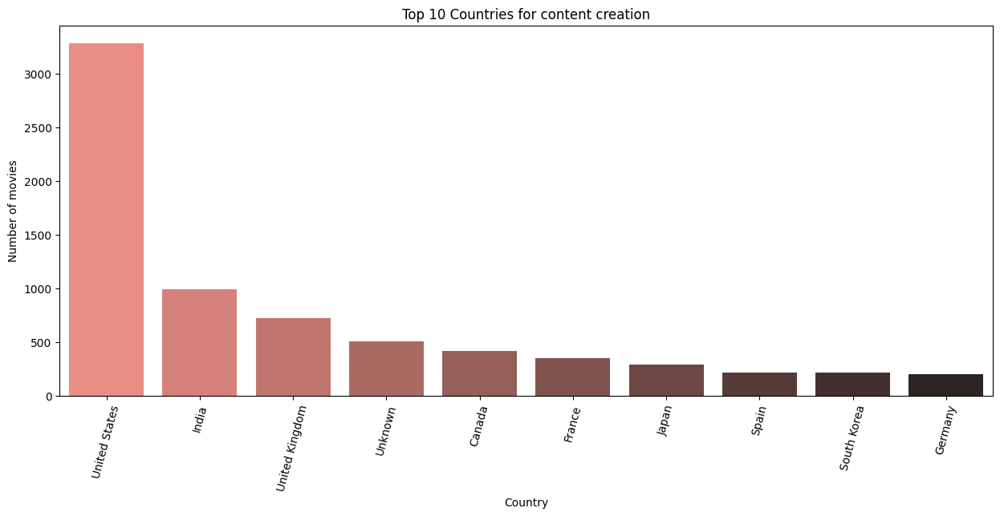

In [ ]:
df_country = df.groupby(['country']).agg({'title':'nunique'}).reset_index().sort_values(by=['title'],ascending=False).head(10)
plt.figure(figsize=(15,6))
sns.barplot(x = "country",y = 'title', data = df_country,palette="dark:salmon_r")
plt.title('Top 10 Countries for content creation')
plt.xlabel('Country')
plt.ylabel('Number of movies')
plt.xticks(rotation = 75)
plt.show()

##### **1. Why did you pick the specific chart?**
To know which country produces Maximum number of TV Shows and Movies.

##### **2. What is/are the insight(s) found from the chart?**


1.  The leading country producing Netflix movies and TV shows is the **United States**. This shows that American programming has a big influence on Netflix.

2. India is the second-largest producer of Netflix movies, a sign of the expanding global appeal of Bollywood films.

3. The data set also includes a sizable representation of countries including Canada, France, and Japan, demonstrating the diversity of Netflix content.


#### **Chart - 6 (Which Genres are Popular in Netflix)**

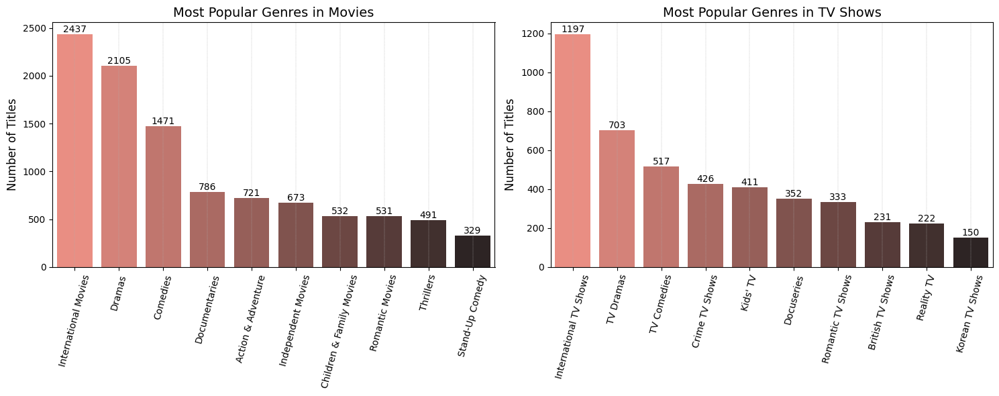

In [ ]:
plt.style.use('default')
plt.figure(figsize=(15, 6))

# Most Popular Genre in Movies and TV Shows
for i, (dataframe, category) in enumerate([(df_movies, 'Movies'), (df_tvshows, 'TV Shows')]):
    plt.subplot(1, 2, i + 1)
    df_genre = dataframe.groupby(['listed_in']).agg({'title': 'nunique'}).reset_index().sort_values(by=['title'], ascending=False).head(10)
    plots = sns.barplot(x="listed_in", y='title', data=df_genre, palette="dark:salmon_r")
    plt.title(f'Most Popular Genres in {category}', fontsize=14)
    plt.ylabel('Number of Titles', fontsize=12)
    plt.xlabel('')
    plt.xticks(rotation=75)
    plt.grid(axis='x', linestyle='--', linewidth=0.3)
    plots.bar_label(plots.containers[0], fmt='%d', fontsize=10)

# Adjust spacing between subplots
plt.tight_layout()
plt.show()


##### **1. Why did you pick the specific chart?**
This graph tells us which genre is most popular in Netflix.


##### **2. What is/are the insight(s) found from the chart?**
**International movies genre is most popular** in both the TV Shows and Movies category. Followed by **Drama** and **comedy**.

##### **3.  Will the gained insights help creating a positive business impact?**
The insights gained can have a positive impact on Netflix's business by helping the platform understand what genres and types of content are popular with its audience. This information can help Netflix tailor its content acquisition and production strategies to better cater to the preferences of its viewers, which can lead to increased engagement and customer satisfaction.

#### **Chart - 7 (Total number of Movies/TV Shows released and added per year on Netflix?)**

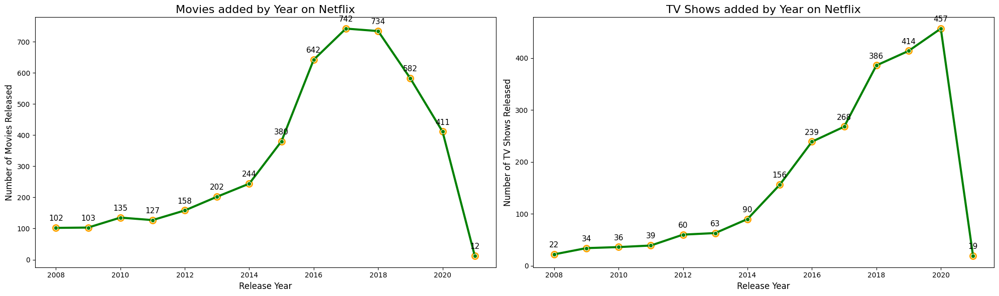

In [ ]:
plt.figure(figsize=(20, 6))

for i, j, k in ((df_movies, 'Movies', 0), (df_tvshows, 'TV Shows', 1)):
    plt.subplot(1, 2, k + 1)
    df_release_year = i.groupby(['release_year']).agg({'title': 'nunique'}).reset_index().sort_values(by=['release_year'], ascending=False)[:14]

    # Create a line plot with custom line color and styling
    plots = sns.lineplot(x='release_year', y='title', data=df_release_year, color='green', marker='o', linewidth=3)
    plt.title(f'{j} added by Year on Netflix', fontsize=16)
    plt.ylabel(f"Number of {j} Released", fontsize=12)
    plt.xlabel('Release Year', fontsize=12)

    # Customize the appearance of data points (scatter)
    sns.scatterplot(x='release_year', y='title', data=df_release_year, color='orange', s=100, marker='o', edgecolor='orange')

    # Annotate data points with values
    for index, row in df_release_year.iterrows():
        plt.annotate(row['title'], (row['release_year'], row['title']), textcoords="offset points", xytext=(0, 10), ha='center', fontsize=11)

plt.tight_layout()
plt.show()


##### **1. Why did you pick the specific chart?**
This graph shows us how many  movies and TV Show released in a year.

##### **2. What is/are the insight(s) found from the chart?**
We can see that the number of movies and TV shows added on Netflix has been increasing steadily every year. But since 2018, the number of Movies released on Netflix has been lowered and the number of TV shows released has been significantly increased. In terms of movies and TV Shows addition, in 2020 Number of movies added as compared to 2019 were vey less and on the other side number of TV Shows were more as compare to 2019.

#### **Chart - 8 (Total Number of Movies/TV Shows added per month on Netflix)**

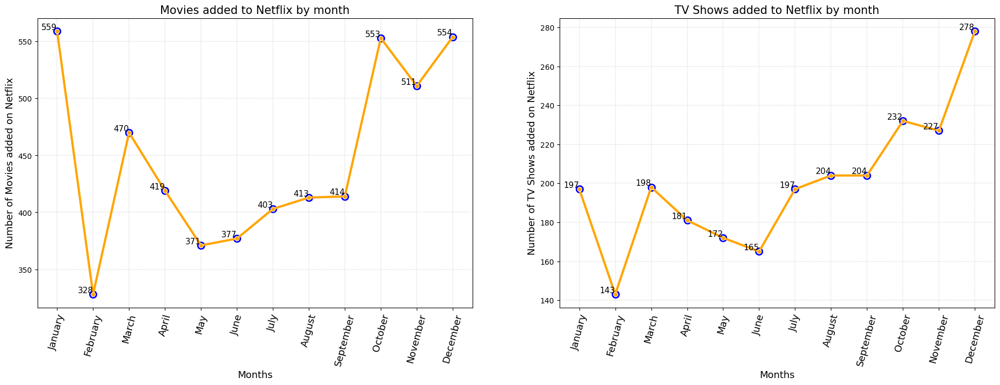

In [ ]:
import calendar  # Import the calendar module to get month names

plt.figure(figsize=(23, 7))
for i, j, k in ((df_movies, 'Movies', 0), (df_tvshows, 'TV Shows', 1)):
    plt.subplot(1, 2, k + 1)
    df_month = i.groupby(['month_added']).agg({'title': 'nunique'}).reset_index().sort_values(by=['month_added'])
    plots = sns.lineplot(x='month_added', y='title', data=df_month, palette='husl', marker='o', color='orange', linewidth=3)
    plt.title(f'{j} added to Netflix by month', fontsize=15)
    plt.ylabel(f"Number of {j} added on Netflix", fontsize=13)
    plt.xlabel('Months', fontsize=13)
    plt.grid(linestyle='--', linewidth=0.3)

    # Customize the appearance of data points (scatter)
    sns.scatterplot(x='month_added', y='title', data=df_month, color='blue', s=100, marker='o', edgecolor='blue')

    for x, y in zip(df_month['month_added'], df_month['title']):
        plt.text(x, y, str(y), ha='right', va='bottom', fontsize=11, color='black')
    # Get month names for x-axis labels
    month_names = [calendar.month_name[i] for i in range(1, 13)]

    # Set x-tick labels to month names
    plt.xticks(range(1, 13), month_names, rotation=75,fontsize = 13)


plt.show()

##### 1. **Why did you pick this specific chart.**

This chart shows us how many films or shows add in a month at netflix.

##### **2.  What is/are the insight(s) found from the chart?**
We found that October, November and December are the most popular months for TV shows addition.

January, October and November are the most popular months for movie addition.

February is the least popular month for the movies and TV shows to be added on Netflix.

#### **Chart-9 (Total Number of Movies/TV Shows added per day on Netflix)**

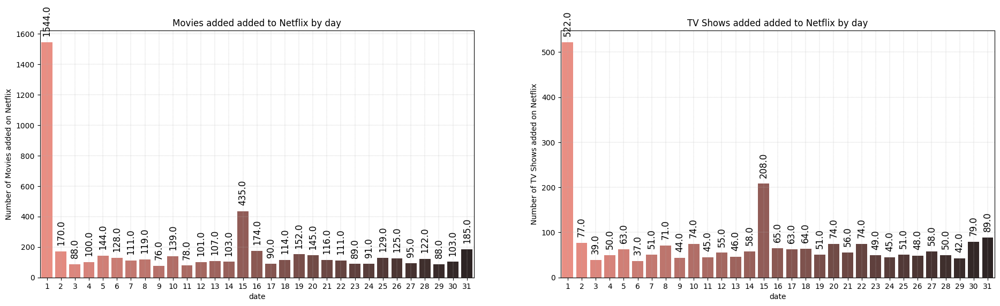

In [ ]:
plt.figure(figsize=(23,6))
for i,j,k in ((df_movies, 'Movies',0),(df_tvshows, 'TV Shows',1)):
  plt.subplot(1,2,k+1)
  df_day = i.groupby(['day_added']).agg({'title':'nunique'}).reset_index().sort_values(by=['day_added'],ascending=False)
  plots= sns.barplot(x = 'day_added',y='title', data = df_day, palette="dark:salmon_r")
  plt.title(f'{j} added added to Netflix by day')
  plt.ylabel(f"Number of {j} added on Netflix")
  plt.xlabel('date')
  plt.grid(linestyle='--', linewidth=0.3)
  for bar in plots.patches:
     plots.annotate(bar.get_height(),
                    (bar.get_x() + bar.get_width() / 2,
                     bar.get_height()), ha='center', va='bottom',
                    size=12, xytext=(0, 8),
                    textcoords='offset points', rotation=90)
plt.show()

##### 1. **Why did you pick this specific chart.**

This chart shows us how many films or shows add at specific dates on netflix.

##### **2.  What is/are the insight(s) found from the chart?**
From the above bar plots, it can be observed that most of the movies and TV shows are added at the beginning or middle of the month. It could be because most people tend to have more free time at the beginning of the month after getting paid, and releasing new content during that time could increase viewership. By releasing new content at the beginning and middle of the month, subscribers are more likely to feel that they are getting value for their money, which could lead to increased retention rates

#### **Chart - 10 (What is the Distribution of Duration of contents over Netflix?**

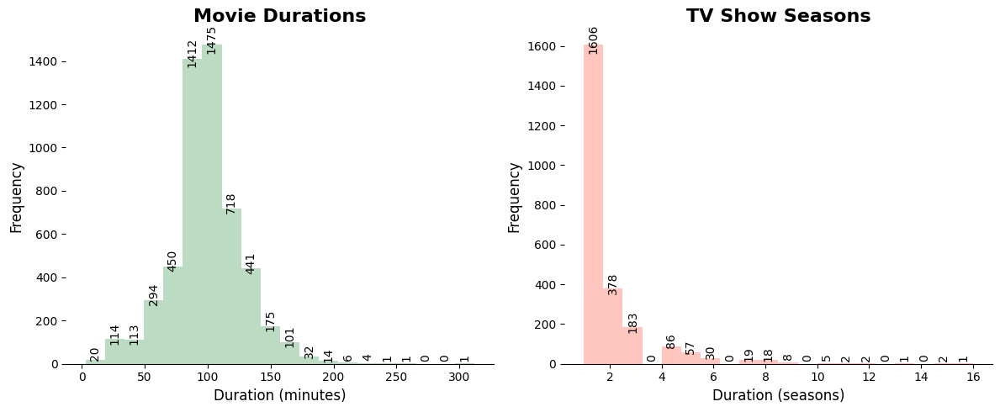

In [ ]:
# Set custom color palettes for movies and TV shows
colors = ['#55a868', '#ff6f61']
titles = ['Movie Durations', 'TV Show Seasons']
df_unique_movies = df_movies[['title', 'duration']].drop_duplicates()
df_unique_shows = df_tvshows[['title', 'duration']].drop_duplicates()
dataframes = [df_unique_movies, df_unique_shows]

plt.figure(figsize=(12, 5))

for i, (title, color, dataframe) in enumerate(zip(titles, colors, dataframes)):
    plt.subplot(1, 2, i + 1)
    plots = sns.distplot(dataframe['duration'], kde=False, color=color, bins=20)
    plt.title(title, fontsize=16, fontweight="bold")
    plt.xlabel('Duration (minutes)' if i == 0 else 'Duration (seasons)', fontsize=12)
    plt.ylabel('Frequency', fontsize=12)

    for bar in plots.patches:
        plt.annotate(
            format(bar.get_height(), '.0f'),
            (bar.get_x() + bar.get_width() / 2, bar.get_height()),
            ha='center', va='center', size=10, xytext=(0, 5),
            textcoords='offset points', rotation=90, color='black'
        )

    sns.despine(left=True)

plt.tight_layout()
plt.show()



##### **1. Why did you pick the specific chart?**
To know the duration distribution for Movies and TV Shows on Netflix.



##### **2. What is/are the insight(s) found from the chart?**
1.The histogram of the distribution of movie durations in minutes on Netflix shows that the *majority of movies on Netflix have a duration between 80 to 120 minutes. *

2.The countplot of the distribution of TV show durations in seasons on Netflix shows that the most common duration for TV shows on Netflix is one season, followed by two seasons.

#### **Chart-11 distribution by its type**

In [ ]:

# Create a new column 'movie_type' based on the duration
df_movies['type'] = np.where(df_movies['duration'] > 120, 'long movie', 'short movie')
df_tvshows['type'] = np.where(df_tvshows['duration']>2, 'long show', 'short show')

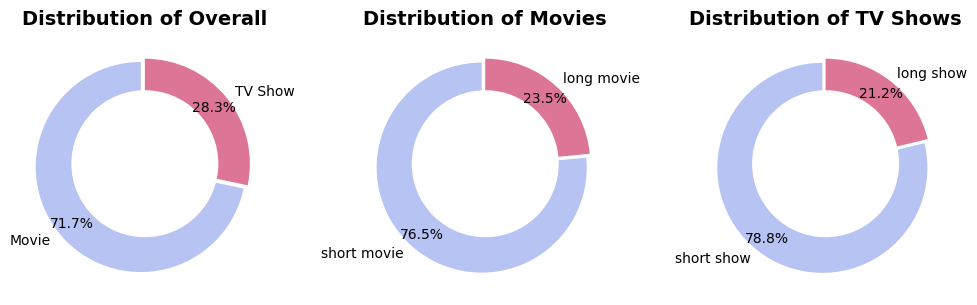

In [ ]:
plt.figure(figsize=(10, 5))

for i, j, k in ((df, 'Overall',0),(df_movies, 'Movies',1),(df_tvshows, 'TV Shows',2)):
    plt.subplot(1, 3, k + 1)
    df_show_type = i['type'].value_counts()
    explode = (0.05, 0)

    plt.pie(df_show_type, labels=df_show_type.index, colors=['#B7C3F3', '#DD7596'], autopct='%1.1f%%', startangle=90, pctdistance=0.85, explode=explode)

    # Draw a circle to make it a donut chart
    centre_circle = plt.Circle((0,0),0.70,fc='white')
    fig = plt.gcf()
    fig.gca().add_artist(centre_circle)

    plt.title(f'Distribution of {j}', fontsize=14, fontweight='bold')

plt.tight_layout()
plt.show()


##### **1. Why did you pick the specific chart?**
To know the duration distribution for Movies and TV Shows on Netflix.



##### **2. What is/are the insight(s) found from the chart?**
In this chart we get 71.7% movie and 28.3% are tv shows where as aproximate 77% share has short movie(below 120 minutes) in movie distributation and 78.8% tv show are the short show(below 2 season).


# **Bivariate analysis**

Now we'll look at country-by-country release analysis.

In [ ]:
import plotly.graph_objs as go

# Group the data by country and calculate the total number of releases
country_counts = df2.groupby('country')['type'].value_counts().unstack().reset_index().fillna(0)
country_counts['Total'] = country_counts['TV Show'] + country_counts['Movie']

# Create a choropleth trace for total releases
trace_total_releases = go.Choropleth(
    locations=country_counts['country'],
    locationmode='country names',
    z=country_counts['Total'],
    text=country_counts['country'],
    colorscale='mint',
    reversescale=True,
    colorbar=dict(title='Total Releases'),
    name='Total Releases'
)

# Create the layout
layout = go.Layout(
    title='Total Number of Releases (TV Shows + Movies) per Country',
    geo=dict(
        showframe=False,
        showcoastlines=True,
        projection_type='natural earth',
        lakecolor='rgb(255, 255, 255)',  # Set lake color to white
    ),
    margin=dict(l=0, r=0, b=0, t=40),  # Adjust margins for better appearance
    paper_bgcolor='rgba(0,0,0,0)',  # Set background color to transparent
    plot_bgcolor='rgba(0,0,0,0)',  # Set plot area background color to transparent
    font=dict(color='white'),  # Set text color to white
)

# Create the figure
fig = go.Figure(data=[trace_total_releases], layout=layout)

# Show the figure
fig.show()


##### 1. Why did you pick the specific chart?

Choropleth maps are a simple approach to display how a measurement changes throughout a geographic area or the amount of variability within a region. Like a heatmap but with geographic borders.

##### 2. What is/are the insight(s) found from the chart?

Choropeth trace tell about the total number of releases as per country like India have 923 releases, Brazil have 72 releases, and so on.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

The gained insights about the total number of releases per country, such as India having 923 releases and Brazil having 72 releases, can potentially have both positive and negative business impacts
1. Netflix's market penetration and expansion efforts are influenced by country releases, with higher numbers in India indicating strong presence and investment. Targeting specific regions, local partnerships, and original productions informs decision-making.
2. Netflix's focus on high-release countries may hinder growth, while neglecting lower-release countries may miss untapped audiences and subscribers.
3. Netflix can expand its reach by investing in localization, market analysis, and diversifying content to attract lower-release viewers and stimulate growth.

# **Textual Data Preprocessing**

(It's mandatory for textual dataset i.e., NLP, Sentiment Analysis, Text Clustering etc.)

In [ ]:
df2['director']=df2['director'].apply(lambda x : x.replace(' ',''))
df2['cast']=df2['cast'].apply(lambda x : x.replace(' ',''))
df2['rating']=df2['rating'].apply(lambda x : x.replace('-',''))
df2['listed_in']=df2['listed_in'].apply(lambda x : x.replace(' ',''))

In [ ]:
df2['cast']=df2['cast'].apply(lambda x : x.replace(',' ,' '))

In [ ]:
#appending all text column to single text column to work with
df2['filtered'] = df2['description'] + ' ' + df2['listed_in'] + ' ' + df2['rating'] + ' ' + df2['cast'] + ' ' + df2['director']

In [ ]:
df2['filtered']

0       In a future where the elite inhabit an island ...
1       After a devastating earthquake hits Mexico Cit...
2       When an army recruit is found dead, his fellow...
3       In a postapocalyptic world, rag-doll robots hi...
4       A brilliant group of students become card-coun...
                              ...                        
7782    When Lebanon's Civil War deprives Zozo of his ...
7783    A scrappy but poor boy worms his way into a ty...
7784    In this documentary, South African rapper Nast...
7785    Dessert wizard Adriano Zumbo looks for the nex...
7786    This documentary delves into the mystique behi...
Name: filtered, Length: 7770, dtype: object

In [ ]:
df2.shape

(7770, 13)

#### 1. Expand Contraction

In [ ]:
df2['filtered_new'] = df2['filtered'].copy()

#### 2. Lower Casing

In [ ]:
# Lower Casing
df2['filtered_new' ]= df2['filtered_new'].str.lower()

#### 3. Removing Punctuations

In [ ]:
import re
df2['filtered_new'] = df2['filtered_new'].apply(lambda x: re.sub(r'[^a-zA-Z]', ' ', x))

#### 4. Removing URLs & Removing words and digits contain digits.

In [ ]:
filtered_new_df = df2.copy()

for i in range(len(df2['filtered_new'])):
    new_com = ''
    try:
        for word in df2['filtered_new'][i].split():
            # Remove URLs
            if not word.startswith("http"):
                # Remove words and digits containing digits
                if not bool(re.search(r'\d', word)):
                    new_com += ' ' + word
        filtered_new_df.at[i, 'filtered_new'] = new_com.strip()
    except KeyError:
        pass


#### 5. Removing Stopwords & Removing White spaces

In [ ]:
from nltk.corpus import stopwords
stopwords = set(stopwords.words('english'))

filtered_new_df['filtered_new'] = filtered_new_df['filtered_new'].apply(lambda x: ' '.join([word for word in x.split() if word.lower() not in stopwords]))
filtered_new_df['filtered_new'] = filtered_new_df['filtered_new'].apply(lambda x: ' '.join(x.split()))


#### 6. Rephrase Text

In [ ]:
# Rephrase Text
def rephrase_sentence(sentence):
    return sentence

filtered_new_df['filtered_new'] = filtered_new_df['filtered_new'].apply(lambda x: rephrase_sentence(x))

In [ ]:
len(filtered_new_df['filtered_new'])

7770

#### 7. Tokenization

In [ ]:
filtered_new_df['tokenized'] = filtered_new_df['filtered_new'].apply(lambda x: word_tokenize(x))

#### 8. Text Normalization

In [ ]:
from nltk.stem import WordNetLemmatizer

lemmatizer = WordNetLemmatizer()
filtered_new_df['filtered_new'] = filtered_new_df['filtered_new'].apply(lambda x: ' '.join([lemmatizer.lemmatize(word) for word in x.split()]))


In [ ]:
df2.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,filtered,filtered_new
0,s1,TV Show,3%,Unknown,JoãoMiguel BiancaComparato MichelGomes Rodolfo...,Brazil,"August 14, 2020",2020,TVMA,4 Seasons,"InternationalTVShows,TVDramas,TVSci-Fi&Fantasy",In a future where the elite inhabit an island ...,In a future where the elite inhabit an island ...,in a future where the elite inhabit an island ...
1,s2,Movie,7:19,JorgeMichelGrau,DemiánBichir HéctorBonilla OscarSerrano Azalia...,Mexico,"December 23, 2016",2016,TVMA,93 min,"Dramas,InternationalMovies",After a devastating earthquake hits Mexico Cit...,After a devastating earthquake hits Mexico Cit...,after a devastating earthquake hits mexico cit...
2,s3,Movie,23:59,GilbertChan,TeddChan StellaChung HenleyHii LawrenceKoh Tom...,Singapore,"December 20, 2018",2011,R,78 min,"HorrorMovies,InternationalMovies","When an army recruit is found dead, his fellow...","When an army recruit is found dead, his fellow...",when an army recruit is found dead his fellow...
3,s4,Movie,9,ShaneAcker,ElijahWood JohnC.Reilly JenniferConnelly Chris...,United States,"November 16, 2017",2009,PG13,80 min,"Action&Adventure,IndependentMovies,Sci-Fi&Fantasy","In a postapocalyptic world, rag-doll robots hi...","In a postapocalyptic world, rag-doll robots hi...",in a postapocalyptic world rag doll robots hi...
4,s5,Movie,21,RobertLuketic,JimSturgess KevinSpacey KateBosworth AaronYoo ...,United States,"January 1, 2020",2008,PG13,123 min,Dramas,A brilliant group of students become card-coun...,A brilliant group of students become card-coun...,a brilliant group of students become card coun...


##### Which text normalization technique have you used and why?

 Normalisation methods include eliminating spaces, hyphens, lowercase letters and numbers, non-alphabetic characters, stopwords, and lemmatization. These procedures help in standardising and getting text data ready for other types of analysis, such as text gathering or tasks involving natural language processing. The code lowercases every word, strips out non-alphabetic letters, and eliminates stopwords before concatenating them into a single column labelled "filtered." By reducing words to their dictionary definition, the lemmatization procedure normalises word variants.

#### 9. Part of speech tagging

In [ ]:
# POS Taging
def pos_tagging(text):
    tokens = word_tokenize(text)
    pos_tags = nltk.pos_tag(tokens)
    return pos_tags

# Apply POS Tagging
filtered_new_df['pos_tags'] = filtered_new_df['filtered_new'].apply(lambda x: pos_tagging(x))

# Print POS tags for each row
for index, row in filtered_new_df.iterrows():
    print(f"Row {index + 1} POS tags:")
    print(row['pos_tags'])
    print()

Streaming output truncated to the last 5000 lines.
[('feeling', 'VBG'), ('guilty', 'JJ'), ('high', 'JJ'), ('speed', 'NN'), ('chase', 'NN'), ('leaf', 'JJ'), ('girl', 'NN'), ('dead', 'JJ'), ('determined', 'VBD'), ('sergeant', 'JJ'), ('pursues', 'NNS'), ('crime', 'NN'), ('bos', 'NN'), ('triggered', 'VBD'), ('fatal', 'JJ'), ('car', 'NN'), ('accident', 'NN'), ('action', 'NN'), ('adventure', 'NN'), ('internationalmovies', 'NNS'), ('tv', 'VBP'), ('nicholastse', 'JJ'), ('nickcheung', 'NN'), ('zhangjing', 'VBG'), ('chu', 'JJ'), ('miaopu', 'NN'), ('liukai', 'NN'), ('chi', 'NN'), ('philipkeung', 'NN'), ('kwokjing', 'VBG'), ('hung', 'NN'), ('shermanchung', 'NN'), ('zhanghe', 'NN'), ('wongsuet', 'NN'), ('yin', 'NN'), ('wongsum', 'NN'), ('yin', 'NN'), ('dantelam', 'NN')]

Row 6122 POS tags:
[('artistic', 'JJ'), ('pursuit', 'NN'), ('two', 'CD'), ('childhood', 'NN'), ('friend', 'NN'), ('aspiring', 'VBG'), ('singer', 'NN'), ('talented', 'VBD'), ('dancer', 'JJ'), ('lead', 'JJ'), ('four', 'CD'), ('someth

#### 10. Text Vectorization

In [ ]:
# Vectorizing Text
t_vectorizer = TfidfVectorizer(max_df=0.8, max_features=10000)
X = t_vectorizer.fit_transform(df2['filtered_new'])
X

<7770x10000 sparse matrix of type '<class 'numpy.float64'>'
	with 205109 stored elements in Compressed Sparse Row format>

In [ ]:
X.shape

(7770, 10000)

##### Which text vectorization technique have you used and why?

TF-IDF vectorization is a text analysis approach that gives more importance to words that appear often in a document but are less common in the entire collection. This helps in capturing discriminative power and reduces the significance of common phrases across various papers. The TF-IDF is frequently used for document categorization, clustering, and information retrieval, capturing both local and global term significance in a collection of documents.

# **Dimesionality Reduction**

##### Do you think that dimensionality reduction is needed? Explain Why?

Dimensionality reduction is necessary for high-dimensional areas because it deals with issues such as computing efficiency, noise and redundancy reduction, interpretability, and resource limits. PCA and LSA techniques, for example, minimise noise, redundancy, and memory needs, making analysis more manageable, efficient, and interpretable.

In [ ]:
df2.isnull().sum()

show_id         0
type            0
title           0
director        0
cast            0
country         0
date_added      0
release_year    0
rating          0
duration        0
listed_in       0
description     0
filtered        0
filtered_new    0
dtype: int64

In [ ]:
# DImensionality Reduction (If needed)
transformer = PCA()
transformer.fit(X.toarray())

PCA()

Text(0, 0.5, 'cumulative explained variance')

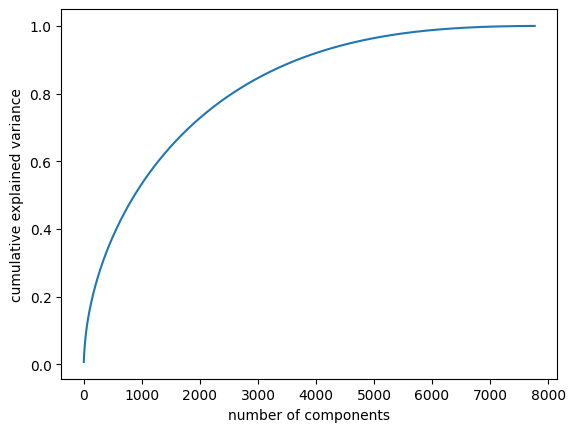

In [ ]:
plt.plot(np.cumsum(transformer.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')


In [ ]:
#choosing right dim from plot, this might take a while, for ready ans use n_components = 4000
from sklearn.decomposition import PCA
transformer = PCA(n_components=4000)
transformer.fit(X.toarray())
X_transformed = transformer.transform(X.toarray())
X_transformed.shape

(7770, 4000)

##### Which dimensionality reduction technique have you used and why? (If dimensionality reduction done on dataset.)

The dimensionality reduction technique used is Principal Component Analysis (PCA). PCA is a widely used technique for dimensionality reduction. It transforms the high-dimensional data into a lower-dimensional representation by identifying and capturing the most important patterns and variances in the data.

In [ ]:
X_vectorized = t_vectorizer.transform(df2['filtered_new'])

In [ ]:
X= transformer.transform(X_vectorized.toarray())


# **ML Model Implementation**

### ML Model - 1

## K-Means Clustering

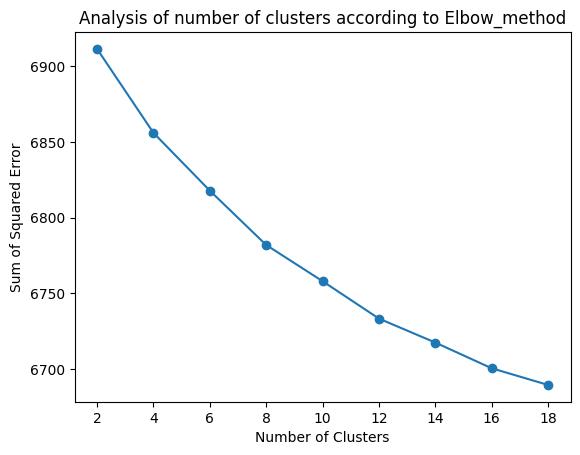

In [ ]:
from sklearn.cluster import KMeans
def optimum_clusters(method_name, features_matrix):
    clusters = range(2, 20, 2)  # Use a step size of 2
    y_axis = []
    early_stop = False

    for i in clusters:
        if early_stop:
            break

        kmeans = KMeans(n_clusters=i, random_state=42)
        kmeans.fit(features_matrix)

        if method_name == 'Elbow_method':
            sse = kmeans.inertia_
            y_axis.append(sse)
            plt.title(f'Analysis of number of clusters according to {method_name}')
            plt.ylabel('Sum of Squared Error')

            # Check early stopping condition
            if len(y_axis) > 2 and y_axis[-1] > y_axis[-2]:
                early_stop = True
        else:
            labels = kmeans.labels_
            silhouette_avg = silhouette_score(features_matrix, labels)
            y_axis.append(silhouette_avg)

            plt.title(f'Analysis of number of clusters according to {method_name}')
            plt.ylabel('Silhouette Score')

    plt.plot(clusters[:len(y_axis)], y_axis, marker='o')
    plt.xlabel('Number of Clusters')
    plt.show()


optimum_clusters('Elbow_method',X_transformed)

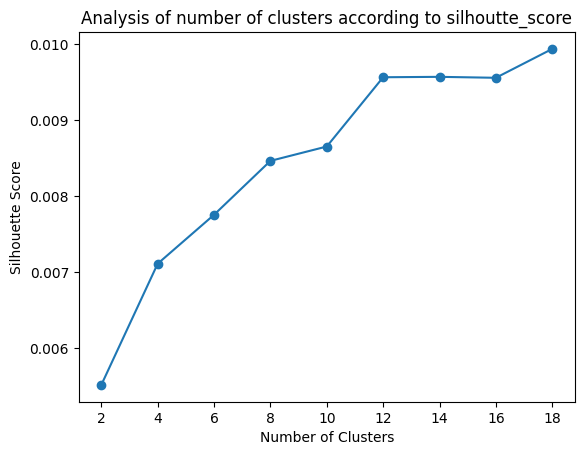

In [ ]:
optimum_clusters('silhoutte_score',X_transformed)


#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

K-means clustering is an unsupervised machine learning approach that uses similarity to divide data into specified groupings. Iteratively, it assigns data points to the closest centroid and updates centroids depending on mean. Although assessing cluster quality is difficult, measurements such as inertia and silhouette score might help.

#### 2. Cross- Validation & Hyperparameter Tuning

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.cluster import KMeans

# Define the parameter grid
param_grid = {
    'n_clusters': [3,5,9],
    'random_state': [1,42],
    'init': ['k-means++'],
    'max_iter': [300],
    'n_init': [1]
}

# Create the KMeans instance
kmean = KMeans()

# Create the GridSearchCV instance with reduced cv folds
grid_search = GridSearchCV(estimator=kmean, param_grid=param_grid, cv=3)

# Fit the data to perform the grid search
grid_search.fit(X)

# Get the best parameters and best score
best_params = grid_search.best_params_
best_score = grid_search.best_score_

# Instantiate KMeans with the best parameters
kmean_best = KMeans(n_clusters=best_params['n_clusters'], random_state=best_params['random_state'])

# Fit the algorithm with the best parameters
kmean_best.fit(X)


KMeans(n_clusters=9, random_state=1)

In [ ]:
#predict the labels of clusters
label = kmean_best.fit_predict(X)

In [ ]:
print("Silhouette Coefficient:  %0.3f"%silhouette_score(X, kmean_best.labels_))

Silhouette Coefficient:  0.009


In [ ]:
# Create a trace for each cluster
u_labels = np.unique(label)
data = []
for i in u_labels:
    data.append(go.Scatter3d(
        x=X[label == i, 0],
        y=X[label == i, 1],
        z=X[label == i, 2],
        mode='markers',
        marker=dict(
            size=5,
            color=i,
            colorscale='cividis',
            opacity=0.8
        ),
        name='Cluster {}'.format(i)
    ))

# Set layout and create figure
layout = go.Layout(
    title='K-means Clustering Results (3D)',
    scene=dict(
        xaxis=dict(title='X'),
        yaxis=dict(title='Y'),
        zaxis=dict(title='Z')
    )
)

fig = go.Figure(data=data, layout=layout)
fig.show()


In [ ]:

from sklearn import metrics

# Compute evaluation metrics
silhouette = metrics.silhouette_score(X, label)
calinski_harabasz = metrics.calinski_harabasz_score(X, label)
davies_bouldin = metrics.davies_bouldin_score(X, label)

# Create a dictionary to store the evaluation metrics
evaluation = {
    'Silhouette': silhouette,
    'Calinski-Harabasz': calinski_harabasz,
    'Davies-Bouldin': davies_bouldin
}

# Display the evaluation metrics
print("Silhouette Score: ", silhouette)
print("Calinski-Harabasz Score: ", calinski_harabasz)
print("Davies-Bouldin Score: ", davies_bouldin)



Silhouette Score:  0.008873459956822894
Calinski-Harabasz Score:  26.62034368716029
Davies-Bouldin Score:  9.1829589600368


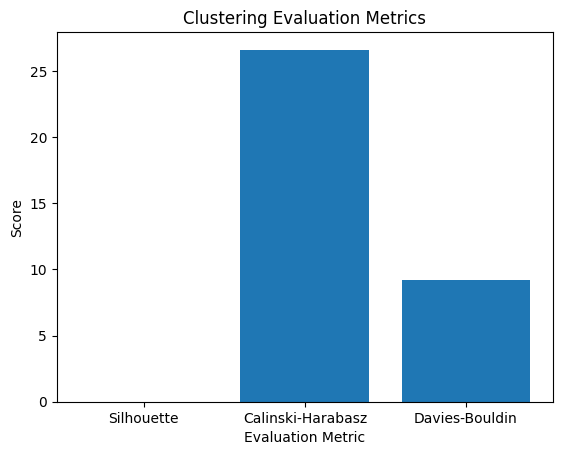

In [ ]:
# Plot the evaluation metrics as a bar chart
plt.bar(evaluation.keys(), evaluation.values())
plt.xlabel('Evaluation Metric')
plt.ylabel('Score')
plt.title('Clustering Evaluation Metrics')
plt.show()

Based on the evaluation metrics, the Calinski-Harabasz score suggests good clustering results with well-separated clusters, while the Silhouette coefficient and Davies-Bouldin index indicate less desirable clustering outcomes with overlapping and dissimilar clusters.

In [ ]:
# kmeans label to cluster column
df2['cluster'] = kmean_best.labels_

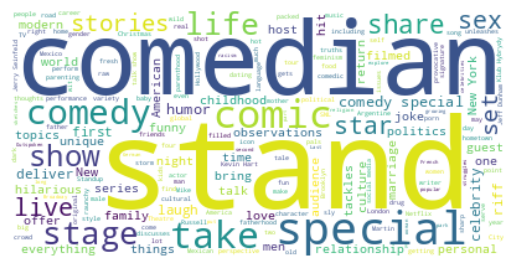

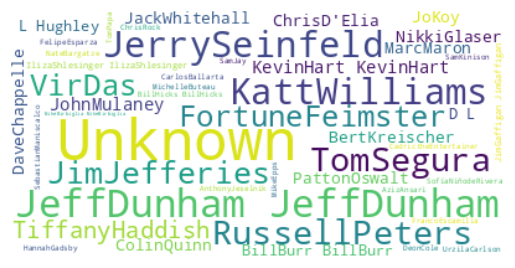

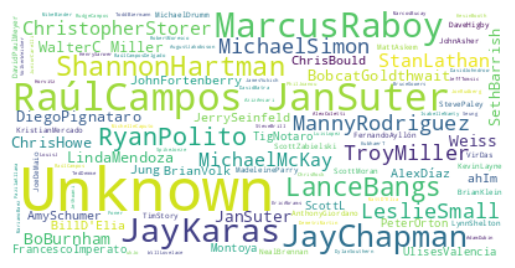

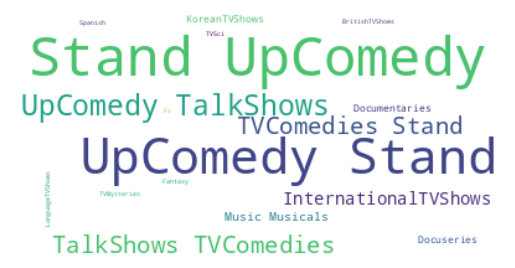

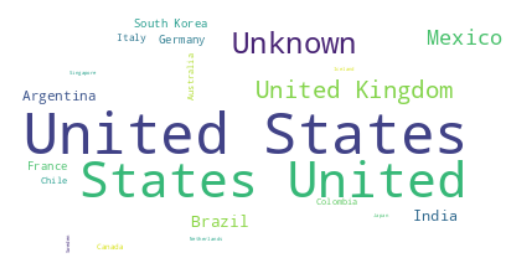

...

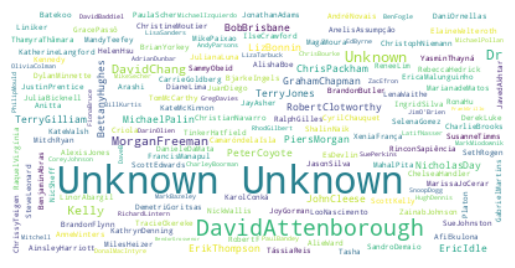

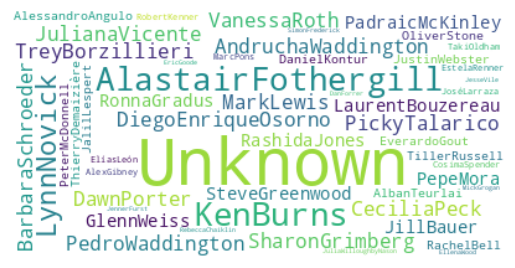

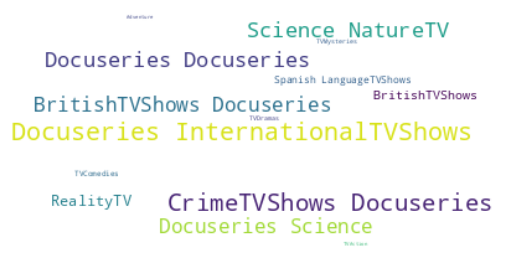

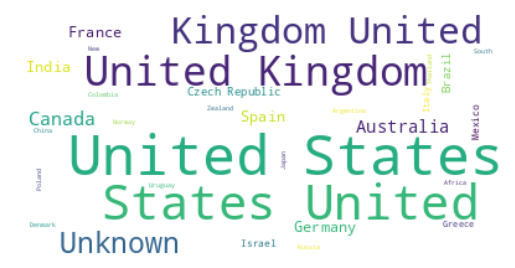

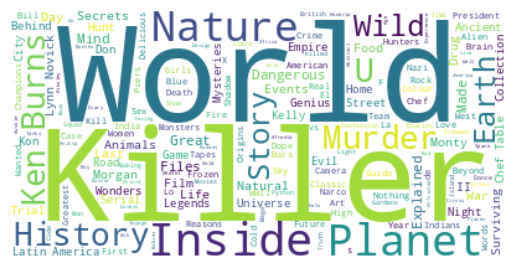

In [ ]:
def generate_word_cloud(category_name, column_of_choice):
    df_word_cloud = df2[['cluster', column_of_choice]].dropna()
    df_word_cloud = df_word_cloud[df_word_cloud['cluster'] == category_name]
    text = " ".join(word for word in df_word_cloud[column_of_choice])

    # Create stopword list:
    stopwords = set(STOPWORDS)

    # Generate a word cloud image
    wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(text)

    # Display the generated image
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()

def generate_word_clouds():
    columns = ['description', 'cast', 'director', 'listed_in', 'country', 'title']

    for i in range(9):
        for column in columns:
            generate_word_cloud(i, column)

generate_word_clouds()


In [ ]:
df2.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,filtered,filtered_new,cluster
0,s1,TV Show,3%,Unknown,JoãoMiguel BiancaComparato MichelGomes Rodolfo...,Brazil,"August 14, 2020",2020,TVMA,4 Seasons,"InternationalTVShows,TVDramas,TVSci-Fi&Fantasy",In a future where the elite inhabit an island ...,In a future where the elite inhabit an island ...,in a future where the elite inhabit an island ...,4
1,s2,Movie,7:19,JorgeMichelGrau,DemiánBichir HéctorBonilla OscarSerrano Azalia...,Mexico,"December 23, 2016",2016,TVMA,93 min,"Dramas,InternationalMovies",After a devastating earthquake hits Mexico Cit...,After a devastating earthquake hits Mexico Cit...,after a devastating earthquake hits mexico cit...,1
2,s3,Movie,23:59,GilbertChan,TeddChan StellaChung HenleyHii LawrenceKoh Tom...,Singapore,"December 20, 2018",2011,R,78 min,"HorrorMovies,InternationalMovies","When an army recruit is found dead, his fellow...","When an army recruit is found dead, his fellow...",when an army recruit is found dead his fellow...,1
3,s4,Movie,9,ShaneAcker,ElijahWood JohnC.Reilly JenniferConnelly Chris...,United States,"November 16, 2017",2009,PG13,80 min,"Action&Adventure,IndependentMovies,Sci-Fi&Fantasy","In a postapocalyptic world, rag-doll robots hi...","In a postapocalyptic world, rag-doll robots hi...",in a postapocalyptic world rag doll robots hi...,6
4,s5,Movie,21,RobertLuketic,JimSturgess KevinSpacey KateBosworth AaronYoo ...,United States,"January 1, 2020",2008,PG13,123 min,Dramas,A brilliant group of students become card-coun...,A brilliant group of students become card-coun...,a brilliant group of students become card coun...,1


##### Which hyperparameter optimization technique have you used and why?

GridSearchCV is a hyperparameter optimization technique that searches a grid for optimal hyperparameter combinations using cross-validation. GridSearchCV optimizes hyperparameters for optimal K-means clustering performance by evaluating combinations and cross-validation, ensuring generalizability and optimal clustering results. We conclude that the optimum number for n_cluster is 9 and the greatest value for random_state is 42.

In [ ]:
def create_cluster_wordcloud(df, cluster_number):
    cluster_df = df2[df2['cluster'] == cluster_number]
    text = ' '.join(cluster_df['description'].dropna())

    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)

    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Word Cloud for Cluster {cluster_number}')
    plt.axis('off')
    plt.show()


In [ ]:
df2['cluster'].unique()

array([4, 1, 6, 8, 3, 7, 2, 5, 0], dtype=int32)

### kids'TV, Children and Family Movies

In [ ]:
df2[df2['cluster'] == 0][['type','title','director','cast','country','rating','listed_in','description']]


,type,title,director,cast,country,rating,listed_in,description
197,TV Show,A Little Help with Carol Burnett,Unknown,CarolBurnett RussellPeters MarkCuban TarajiP.H...,United States,TVG,"Stand-UpComedy&TalkShows,TVComedies",Comedy icon Carol Burnett returns to TV with a...
220,Movie,A Russell Peters Christmas,HenrySarwer-Foner,RussellPeters PamelaAnderson MichaelBublé JonL...,Canada,NR,Stand-UpComedy,"Inspired by the variety shows of the 1970s, ""A..."
284,TV Show,Abnormal Summit,"Jung-ahIm,Seung-ukJo",Hyun-mooJun Si-kyungSung Se-yoonYoo,South Korea,TVPG,"InternationalTVShows,KoreanTVShows,Stand-UpCom...","Led by a trio of Korean celebs, a multinationa..."
305,Movie,Adam Devine: Best Time of Our Lives,JayKaras,AdamDevine,United States,TVMA,Stand-UpComedy,Frenetic comic Adam Devine talks teen awkwardn...
307,Movie,ADAM SANDLER 100% FRESH,SteveBrill,AdamSandler,United States,TVMA,Stand-UpComedy,"From ""Heroes"" to ""Ice Cream Ladies"" – Adam San..."
...,...,...,...,...,...,...,...,...
7718,Movie,Yoo Byung Jae: Discomfort Zone,Y.JoonChung,YooByungJae,South Korea,TVMA,Stand-UpComedy,Daring comedian Yoo Byung-jae connects critici...
7719,Movie,Yoo Byung Jae: Too Much Information,YooByung-jae,YooByung-jae,Unknown,TVMA,Stand-UpComedy,"""Saturday Night Live Korea"" writer-turned-come..."
7744,Movie,"Yours Sincerely, Kanan Gill",NevilleShah,KananGill,India,TVMA,Stand-UpComedy,Revisiting life goals set in a letter written ...
7757,Movie,Zach Galifianakis: Live at the Purple Onion,MichaelBlieden,ZachGalifianakis BrianUnger,United States,TVMA,Stand-UpComedy,"The unorthodox, piano-playing stand-up star Za..."


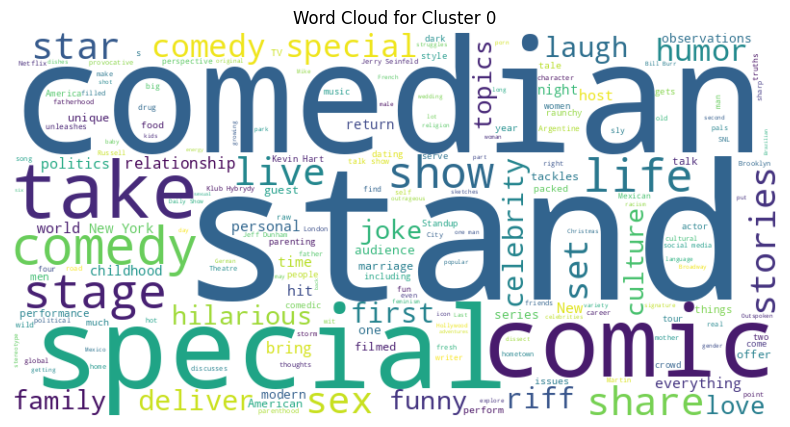

In [ ]:
create_cluster_wordcloud(df2, 0)

### Action and Adventures, Sci-FI and Fantasy

In [ ]:
df2[df2['cluster'] == 1][['type','title','director','cast','country','rating','listed_in','description']]


,type,title,director,cast,country,rating,listed_in,description
1,Movie,7:19,JorgeMichelGrau,DemiánBichir HéctorBonilla OscarSerrano Azalia...,Mexico,TVMA,"Dramas,InternationalMovies",After a devastating earthquake hits Mexico Cit...
2,Movie,23:59,GilbertChan,TeddChan StellaChung HenleyHii LawrenceKoh Tom...,Singapore,R,"HorrorMovies,InternationalMovies","When an army recruit is found dead, his fellow..."
4,Movie,21,RobertLuketic,JimSturgess KevinSpacey KateBosworth AaronYoo ...,United States,PG13,Dramas,A brilliant group of students become card-coun...
6,Movie,122,YasirAlYasiri,AminaKhalil AhmedDawood TarekLotfy AhmedElFish...,Egypt,TVMA,"HorrorMovies,InternationalMovies","After an awful accident, a couple admitted to ..."
7,Movie,187,KevinReynolds,SamuelL.Jackson JohnHeard KellyRowan CliftonCo...,United States,R,Dramas,After one of his high school students attacks ...
...,...,...,...,...,...,...,...,...
7774,Movie,Zodiac,DavidFincher,MarkRuffalo JakeGyllenhaal RobertDowneyJr. Ant...,United States,R,"CultMovies,Dramas,Thrillers","A political cartoonist, a crime reporter and a..."
7778,Movie,Zombieland,RubenFleischer,JesseEisenberg WoodyHarrelson EmmaStone Abigai...,United States,R,"Comedies,HorrorMovies",Looking to survive in a world taken over by zo...
7780,Movie,Zoo,ShlokSharma,ShashankArora ShwetaTripathi RahulKumar GopalK...,India,TVMA,"Dramas,IndependentMovies,InternationalMovies",A drug dealer starts having doubts about his t...
7782,Movie,Zozo,JosefFares,ImadCreidi AntoinetteTurk EliasGergi CarmenLeb...,"Sweden, Czech Republic, United Kingdom, Denmar...",TVMA,"Dramas,InternationalMovies",When Lebanon's Civil War deprives Zozo of his ...


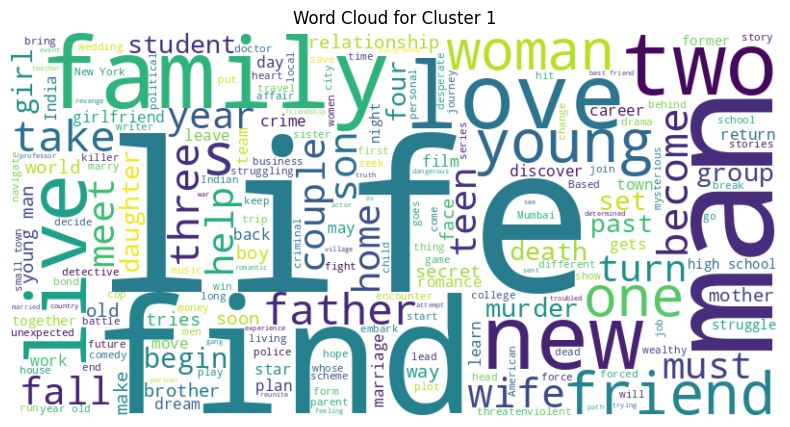

In [ ]:
create_cluster_wordcloud(df2, 1)

### Stand-Up Comedy Show, International, India

In [ ]:
df2[df2['cluster'] == 2][['type','title','director','cast','country','rating','listed_in','description']]

,type,title,director,cast,country,rating,listed_in,description
55,Movie,100 Things to do Before High School,Unknown,IsabelaMoner JaheemToombs OwenJoyner JackDeSen...,United States,TVY,Movies,"Led by seventh-grader C.J., three students who..."
108,TV Show,3Below: Tales of Arcadia,Unknown,TatianaMaslany DiegoLuna NickOfferman NickFros...,United States,TVY7,"Kids'TV,TVAction&Adventure,TVSci-Fi&Fantasy","After crash-landing on Earth, two royal teen a..."
111,TV Show,44 Cats,Unknown,SarahNatochenny SuzyMyers SimonaBerman EricaSc...,Italy,TVY7,Kids'TV,Paw-esome tales abound when singing furry frie...
171,Movie,A Family Reunion Christmas,RobbieCountryman,LorettaDevine TiaMowry-Hardrict AnthonyAlabi T...,United States,TVPG,Movies,M'Dear and her sisters struggle to keep their ...
225,TV Show,A Series of Unfortunate Events,Unknown,NeilPatrickHarris PatrickWarburton MalinaWeiss...,United States,TVPG,"Kids'TV,TVAction&Adventure,TVComedies",The extraordinary Baudelaire orphans face tria...
...,...,...,...,...,...,...,...,...
7756,TV Show,Z4,Unknown,ApolloCosta GabrielSantana MatheusLustosa Pedr...,Brazil,TVPG,Kids'TV,Fading music biz veteran Zé realizes he has ju...
7759,TV Show,Zak Storm,Unknown,MichaelJohnston JessicaGee-George ChristineMar...,"United States, France, South Korea, Indonesia",TVY7,Kids'TV,Teen surfer Zak Storm is mysteriously transpor...
7766,TV Show,Zig & Sharko,Unknown,Unknown,France,TVY7,"Kids'TV,TVComedies","Zig, an island-bound hyena, will do anything t..."
7775,TV Show,Zoids Wild,Unknown,KenshoOno TakahiroSakurai MikakoKomatsu Etsuko...,Japan,TVY7,"AnimeSeries,Kids'TV",A quest for freedom and legendary treasure beg...


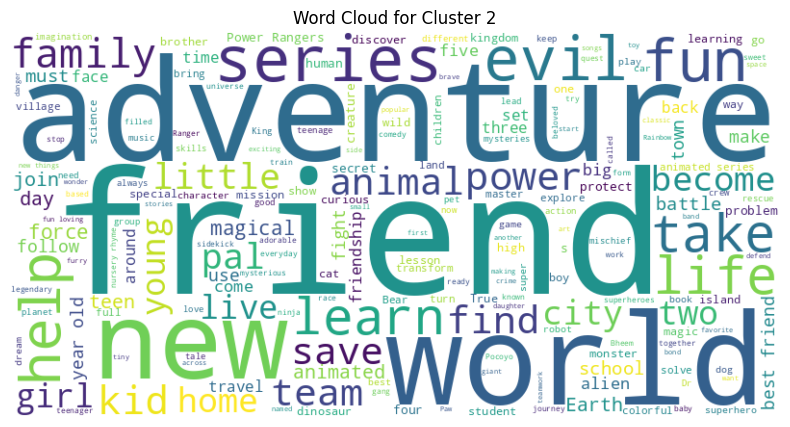

In [ ]:
create_cluster_wordcloud(df2, 2)

### Thrillers, International Movies, Dramas

In [ ]:
df2[df2['cluster'] == 3][['type','title','director','cast','country','rating','listed_in','description']]

,type,title,director,cast,country,rating,listed_in,description
13,Movie,"2,215",NottaponBoonprakob,ArtiwaraKongmalai,Thailand,TVMA,"Documentaries,InternationalMovies,SportsMovies",This intimate documentary follows rock star Ar...
19,Movie,'89,Unknown,LeeDixon IanWright PaulMerson,United Kingdom,TVPG,SportsMovies,"Mixing old footage with interviews, this is th..."
25,Movie,(T)ERROR,"LyricR.Cabral,DavidFelixSutcliffe",Unknown,United States,NR,Documentaries,This real-life look at FBI counterterrorism op...
28,Movie,#AnneFrank - Parallel Stories,"SabinaFedeli,AnnaMigotto",HelenMirren GengherGatti,Italy,TV14,"Documentaries,InternationalMovies","Through her diary, Anne Frank's story is retol..."
30,Movie,#cats_the_mewvie,MichaelMargolis,Unknown,Canada,TV14,"Documentaries,InternationalMovies",This pawesome documentary explores how our fel...
...,...,...,...,...,...,...,...,...
7692,Movie,Ya no estoy aquí: Una conversación entre Guill...,Unknown,GuillermodelToro AlfonsoCuarón,Unknown,TVPG,Documentaries,Guillermo del Toro and Alfonso Cuarón discuss ...
7771,Movie,Zion,FloydRuss,ZionClark,United States,TVPG,"Documentaries,SportsMovies",Born without legs and stuck in foster care for...
7773,Movie,Zoé: Panoramas,"RodrigoGuardiola,GabrielCruzRivas",SergioAcosta JesúsBáez ÁngelMosqueda RodrigoGu...,Mexico,TVMA,"Documentaries,InternationalMovies,Music&Musicals",This introspective rockumentary follows the ca...
7784,Movie,Zulu Man in Japan,Unknown,NastyC,Unknown,TVMA,"Documentaries,InternationalMovies,Music&Musicals","In this documentary, South African rapper Nast..."


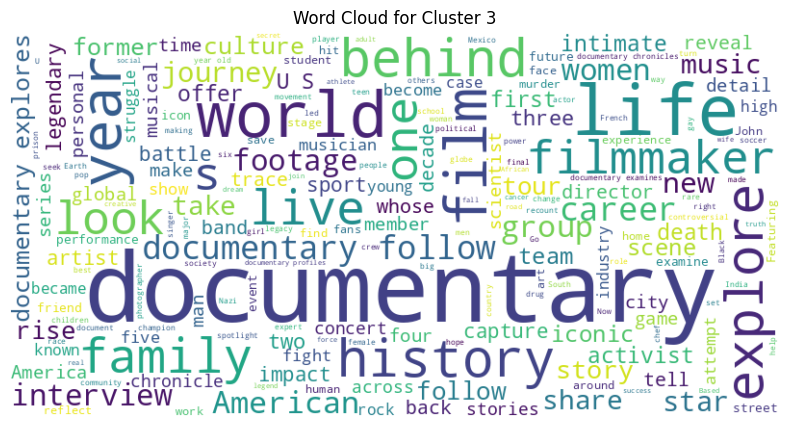

In [ ]:
create_cluster_wordcloud(df2, 3)

### Documentaries, Sports, International, Music and Musicals

In [ ]:
df2[df2['cluster'] == 4][['type','title','director','cast','country','rating','listed_in','description']]

,type,title,director,cast,country,rating,listed_in,description
0,TV Show,3%,Unknown,JoãoMiguel BiancaComparato MichelGomes Rodolfo...,Brazil,TVMA,"InternationalTVShows,TVDramas,TVSci-Fi&Fantasy",In a future where the elite inhabit an island ...
5,TV Show,46,SerdarAkar,ErdalBeşikçioğlu YaseminAllen MelisBirkan Sayg...,Turkey,TVMA,"InternationalTVShows,TVDramas,TVMysteries",A genetics professor experiments with a treatm...
11,TV Show,1983,Unknown,RobertWięckiewicz MaciejMusiał MichalinaOlszań...,"Poland, United States",TVMA,"CrimeTVShows,InternationalTVShows,TVDramas","In this dark alt-history thriller, a naïve law..."
16,TV Show,Feb-09,Unknown,ShahdElYaseen ShailaSabt Hala HanadiAl-Kandari...,Unknown,TV14,"InternationalTVShows,TVDramas","As a psychology professor faces Alzheimer's, h..."
24,TV Show,​SAINT SEIYA: Knights of the Zodiac,Unknown,BrysonBaugus EmilyNeves BlakeShepard PatrickPo...,Japan,TV14,"AnimeSeries,InternationalTVShows",Seiya and the Knights of the Zodiac rise again...
...,...,...,...,...,...,...,...,...
7746,TV Show,دفعة القاهرة,Unknown,Basharal-Shatti FatimaAlSafi MaramBalochi Hama...,Unknown,TV14,"InternationalTVShows,TVDramas",A group of women leaves Kuwait to attend unive...
7752,TV Show,Yummy Mummies,Unknown,LorinskaMerrington JaneScandizzo RachelWatts M...,Australia,TVMA,"InternationalTVShows,RealityTV",It's drama Down Under when expectant mothers w...
7753,TV Show,Yunus Emre,Unknown,GökhanAtalay PayidarTüfekçioglu BaranAkbulut M...,Turkey,TVPG,"InternationalTVShows,TVDramas","During the Mongol invasions, Yunus Emre leaves..."
7767,TV Show,Zindagi Gulzar Hai,Unknown,SanamSaeed FawadKhan AyeshaOmer MehreenRaheel ...,Pakistan,TVPG,"InternationalTVShows,RomanticTVShows,TVDramas","Strong-willed, middle-class Kashaf and carefre..."


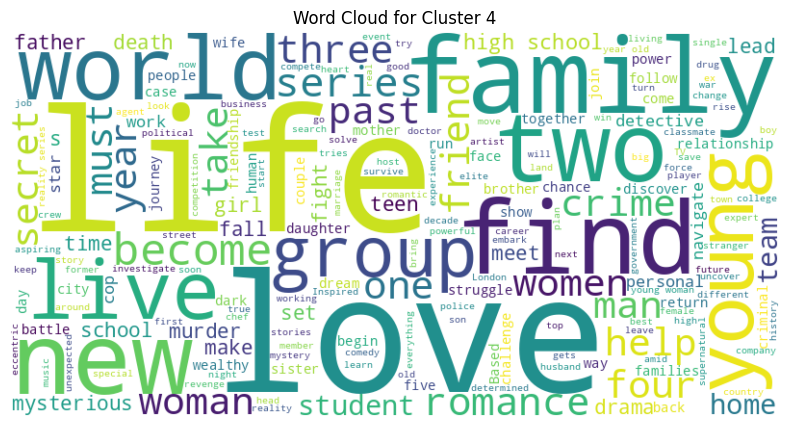

In [ ]:
create_cluster_wordcloud(df2, 4)

### Internation TV Shows, TVDrama, Reality TV

In [ ]:
df2[df2['cluster'] == 5][['type','title','director','cast','country','rating','listed_in','description']]

,type,title,director,cast,country,rating,listed_in,description
113,Movie,48 Christmas Wishes,"MarcoDeufemia,JustinG.Dyck",KhiylaAynne NoahDyer MayaFranzoi ClaraKushnir ...,Canada,TVG,"Children&FamilyMovies,Comedies",When a small town's letters to Santa accidenta...
145,Movie,A 2nd Chance,ClayGlen,NinaPearce AdamTuominen EmilyMorris AmyHandley...,Australia,PG,"Children&FamilyMovies,Dramas,SportsMovies",A gymnast lacks the confidence she needs to re...
147,Movie,A Babysitter's Guide to Monster Hunting,RachelTalalay,TamaraSmart OonaLaurence TomFelton TroyLeigh-A...,United States,TVPG,Children&FamilyMovies,"Recruited by a secret society of babysitters, ..."
159,Movie,A Christmas Prince,AlexZamm,RoseMcIver BenLamb AliceKrige HonorKneafsey,United States,TVPG,"Children&FamilyMovies,Dramas,RomanticMovies",Christmas comes early for an aspiring young jo...
160,Movie,A Christmas Prince: The Royal Baby,JohnSchultz,RoseMcIver BenLamb AliceKrige HonorKneafsey Sa...,United States,TVPG,"Children&FamilyMovies,Dramas,RomanticMovies",Christmas brings the ultimate gift to Aldovia:...
...,...,...,...,...,...,...,...,...
7745,Movie,"Yours, Mine and Ours",RajaGosnell,DennisQuaid ReneRusso SeanFaris KatijaPevec De...,United States,PG,"Children&FamilyMovies,Comedies",When a father of eight and a mother of 10 prep...
7761,Movie,Zapped,PeterDeLuise,Zendaya ChanellePeloso SpencerBoldman EmiliaMc...,"Canada, United States",TVY,"Children&FamilyMovies,Comedies",A girl discovers a dog-training app that can g...
7772,Movie,Zipi & Zape y la Isla del Capitan,OskarSantos,TeoPlanell ToniGómez ElenaAnaya IriaCastellano...,Spain,TVPG,"Children&FamilyMovies,Comedies","At Christmas, Zip and Zap take a trip with the..."
7776,Movie,Zokkomon,SatyajitBhatkal,DarsheelSafary AnupamKher ManjariFadnis TinnuA...,India,PG,"Children&FamilyMovies,Dramas","When his cruel uncle abandons him, a young orp..."


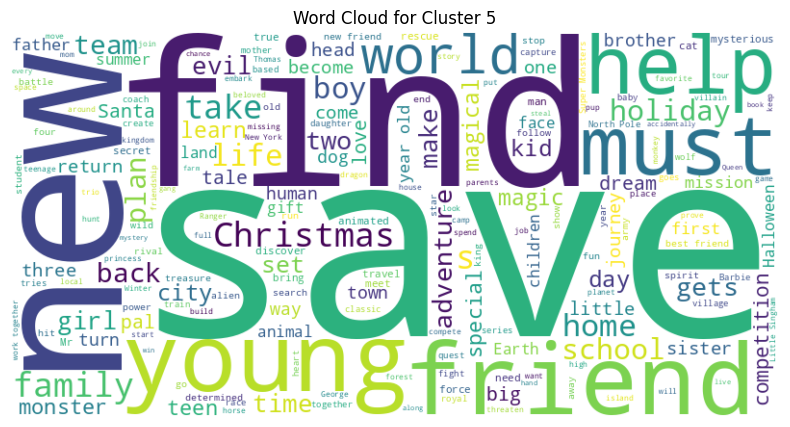

In [ ]:
create_cluster_wordcloud(df2, 5)

### Comedies, Romantic Movies

In [ ]:
df2[df2['cluster'] == 6][['type','title','director','cast','country','rating','listed_in','description']]

,type,title,director,cast,country,rating,listed_in,description
3,Movie,9,ShaneAcker,ElijahWood JohnC.Reilly JenniferConnelly Chris...,United States,PG13,"Action&Adventure,IndependentMovies,Sci-Fi&Fantasy","In a postapocalyptic world, rag-doll robots hi..."
14,Movie,3022,JohnSuits,OmarEpps KateWalsh MirandaCosgrove AngusMacfad...,United States,R,"IndependentMovies,Sci-Fi&Fantasy,Thrillers",Stranded when the Earth is suddenly destroyed ...
21,Movie,​Goli Soda 2,VijayMilton,Samuthirakani BharathSeeni Vinoth EsakkiBarath...,India,TV14,"Action&Adventure,Dramas,InternationalMovies","A taxi driver, a gangster and an athlete strug..."
44,Movie,Æon Flux,KarynKusama,CharlizeTheron MartonCsokas JonnyLeeMiller Sop...,United States,PG13,"Action&Adventure,Sci-Fi&Fantasy","Aiming to hasten an uprising, the leader of an..."
50,Movie,"10,000 B.C.",RolandEmmerich,StevenStrait CamillaBelle CliffCurtis JoelVirg...,"United States, South Africa",PG13,Action&Adventure,Fierce mammoth hunter D'Leh sets out on an imp...
...,...,...,...,...,...,...,...,...
7689,Movie,XXX: State of the Union,LeeTamahori,IceCube SamuelL.Jackson WillemDafoe ScottSpeed...,United States,PG13,Action&Adventure,"In this action-packed follow-up to XXX, U.S. i..."
7696,Movie,Yamla Pagla Deewana 2,SangeethSivan,Dharmendra SunnyDeol BobbyDeol NehaSharma Kris...,India,TV14,"Action&Adventure,Comedies,InternationalMovies","Up to his old tricks, con man Dharam poses as ..."
7728,Movie,You Don't Mess with the Zohan,DennisDugan,AdamSandler JohnTurturro EmmanuelleChriqui Nic...,United States,UR,"Action&Adventure,Comedies",An Israeli counterterrorism soldier with a sec...
7737,Movie,Young Tiger,MuChu,QiuYuen CharlieChin JackieChan HuChin NanChiang,Hong Kong,NR,"Action&Adventure,InternationalMovies","Aided only by a tough female police officer, a..."


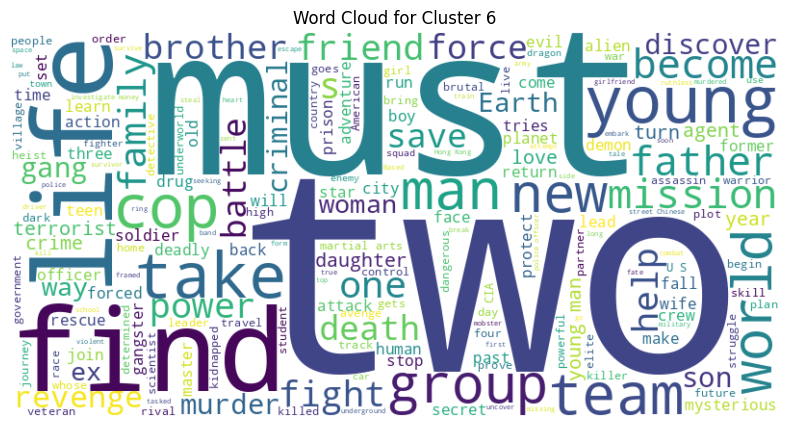

In [ ]:
create_cluster_wordcloud(df2, 6)

### Drama, Horror, International, India

In [ ]:
df2[df2['cluster'] == 7][['type','title','director','cast','country','rating','listed_in','description']]

,type,title,director,cast,country,rating,listed_in,description
33,Movie,#realityhigh,FernandoLebrija,NestaCooper KateWalsh JohnMichaelHiggins Keith...,United States,TV14,Comedies,When nerdy high schooler Dani finally attracts...
39,Movie,"¡Ay, mi madre!",FrankAriza,EstefaníadelosSantos SecundelaRosa TerelePávez...,Spain,TVMA,"Comedies,InternationalMovies","When her estranged mother suddenly dies, a wom..."
46,Movie,1 Chance 2 Dance,AdamDeyoe,LexiGiovagnoli JustinRay RaeLatt PoonamBasu Te...,United States,TVPG,"Dramas,RomanticMovies",When an aspiring dancer is uprooted during her...
57,Movie,100% Halal,JastisArimba,AnisaRahma AriyoWahab AnanditoDwis FitriaRasyi...,Indonesia,TV14,"Dramas,InternationalMovies","After high school, a young woman marries the m..."
61,TV Show,12 Years Promise,Unknown,So-yeonLee NamkoongMin Tae-imLee So-huiYoon Wo...,South Korea,TV14,"InternationalTVShows,KoreanTVShows,RomanticTVS...",A pregnant teen is forced by her family to lea...
...,...,...,...,...,...,...,...,...
7722,Movie,You Are My Home,AmandaRaymond,AlyssaMilano AngelParker CristiándelaFuente Ev...,United States,TVPG,"Children&FamilyMovies,Dramas","After becoming separated from her family, a yo..."
7723,Movie,You Can Tutu,JamesBrown,LilyO'Regan JeannettsyEnriquezBorges JoeleyGib...,United Kingdom,TVG,Children&FamilyMovies,A gifted young ballet dancer struggles to find...
7725,TV Show,You Cannot Hide,Unknown,BlancaSoto EduardoNoriega IvánSánchez MaribelV...,Mexico,TVMA,"CrimeTVShows,InternationalTVShows,Spanish-Lang...",A nurse and her daughter flee her husband’s dr...
7736,Movie,Young Adult,JasonReitman,CharlizeTheron PattonOswalt PatrickWilson Eliz...,United States,R,"Comedies,Dramas,IndependentMovies",When a divorced writer gets a letter from an o...


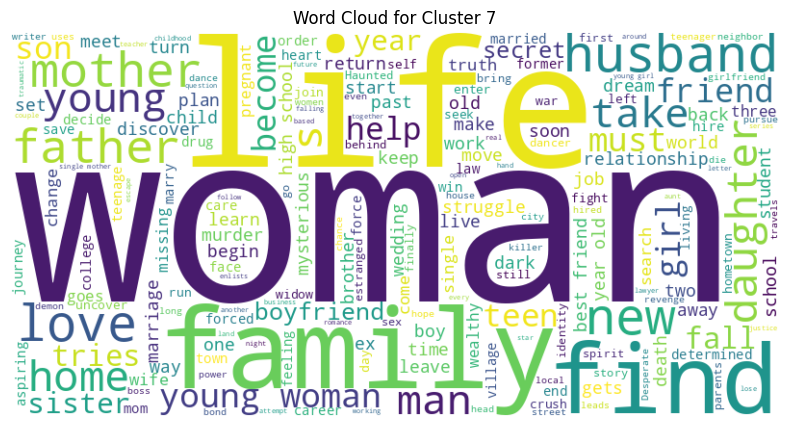

In [ ]:
create_cluster_wordcloud(df2, 7)

### Docuseries, Reality TV, Crime TV

In [ ]:
df2[df2['cluster'] == 8][['type','title','director','cast','country','rating','listed_in','description']]

,type,title,director,cast,country,rating,listed_in,description
12,TV Show,1994,DiegoEnriqueOsorno,Unknown,Mexico,TVMA,"CrimeTVShows,Docuseries,InternationalTVShows",Archival video and new interviews examine Mexi...
26,TV Show,(Un)Well,Unknown,Unknown,United States,TVMA,RealityTV,This docuseries takes a deep dive into the luc...
53,TV Show,100 Humans,Unknown,ZainabJohnson SammyObeid AlieWard,United States,TV14,"Docuseries,Science&NatureTV",One hundred hardy souls from diverse backgroun...
64,TV Show,13 Reasons Why: Beyond the Reasons,Unknown,DylanMinnette KatherineLangford KateWalsh Dere...,United States,TVMA,"CrimeTVShows,Docuseries","Cast members, writers, producers and mental he..."
130,TV Show,60 Days In,Unknown,Unknown,United States,TVMA,RealityTV,"Recruited by a sheriff, volunteers infiltrate ..."
...,...,...,...,...,...,...,...,...
7669,TV Show,World's Busiest Cities,Unknown,AnitaRani AdeAdepitan DanSnow,United Kingdom,TVPG,"BritishTVShows,Docuseries","From Moscow to Mexico City, three BBC journali..."
7670,TV Show,World's Most Wanted,Unknown,Unknown,United States,TV14,"CrimeTVShows,Docuseries,InternationalTVShows","Suspected of heinous crimes, they’ve avoided c..."
7672,TV Show,Wormwood,Unknown,PeterSarsgaard MollyParker ChristianCamargo Sc...,United States,TV14,"CrimeTVShows,Docuseries","In this genre-bending tale, Errol Morris explo..."
7678,TV Show,WWII in HD,Unknown,GarySinise RobLowe JoshLucas JustinBartha AmyS...,United States,TV14,Docuseries,Rare color footage interwoven with firsthand i...


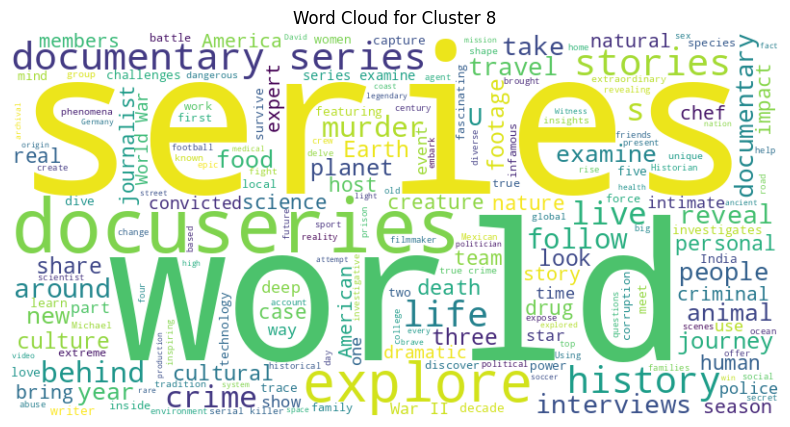

In [ ]:
create_cluster_wordcloud(df2, 8)

### ML Model - 2

## Hierarchical clustering

In [ ]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import make_scorer

# Define the parameter grid
param_grid = {
    'n_clusters': [2, 3, 4]  # specify the different values of n_clusters
}

# Create the AgglomerativeClustering instance
clustering = AgglomerativeClustering()

# Create the GridSearchCV instance with silhouette score as the scoring metric
grid_search = GridSearchCV(estimator=clustering, param_grid=param_grid, cv=3,
                           scoring=make_scorer(silhouette_score))

# Fit the data to perform the grid search
grid_search.fit(X_transformed)

# Get the best parameters and best score
best_params = grid_search.best_params_
best_score = grid_search.best_score_

# Instantiate AgglomerativeClustering with the best parameters
clustering_best = AgglomerativeClustering(n_clusters=best_params['n_clusters'])

# Fit the clustering model with the best parameters
clustering_best.fit(X_transformed)

# Get the cluster labels for each data point
labels = clustering_best.labels_


In [ ]:
# Assigning the clusters to their datapoints.
df2['Agglo_clusters']= labels
df2.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,filtered,filtered_new,cluster,Agglo_clusters
0,s1,TV Show,3%,Unknown,JoãoMiguel BiancaComparato MichelGomes Rodolfo...,Brazil,"August 14, 2020",2020,TVMA,4 Seasons,"InternationalTVShows,TVDramas,TVSci-Fi&Fantasy",In a future where the elite inhabit an island ...,In a future where the elite inhabit an island ...,in a future where the elite inhabit an island ...,4,0
1,s2,Movie,7:19,JorgeMichelGrau,DemiánBichir HéctorBonilla OscarSerrano Azalia...,Mexico,"December 23, 2016",2016,TVMA,93 min,"Dramas,InternationalMovies",After a devastating earthquake hits Mexico Cit...,After a devastating earthquake hits Mexico Cit...,after a devastating earthquake hits mexico cit...,1,0
2,s3,Movie,23:59,GilbertChan,TeddChan StellaChung HenleyHii LawrenceKoh Tom...,Singapore,"December 20, 2018",2011,R,78 min,"HorrorMovies,InternationalMovies","When an army recruit is found dead, his fellow...","When an army recruit is found dead, his fellow...",when an army recruit is found dead his fellow...,1,0
3,s4,Movie,9,ShaneAcker,ElijahWood JohnC.Reilly JenniferConnelly Chris...,United States,"November 16, 2017",2009,PG13,80 min,"Action&Adventure,IndependentMovies,Sci-Fi&Fantasy","In a postapocalyptic world, rag-doll robots hi...","In a postapocalyptic world, rag-doll robots hi...",in a postapocalyptic world rag doll robots hi...,6,0
4,s5,Movie,21,RobertLuketic,JimSturgess KevinSpacey KateBosworth AaronYoo ...,United States,"January 1, 2020",2008,PG13,123 min,Dramas,A brilliant group of students become card-coun...,A brilliant group of students become card-coun...,a brilliant group of students become card coun...,1,0


In [ ]:
df2['Agglo_clusters'].value_counts()

0    7404
1     366
Name: Agglo_clusters, dtype: int64

In [ ]:
df2['Agglo_clusters'].unique()

array([0, 1])

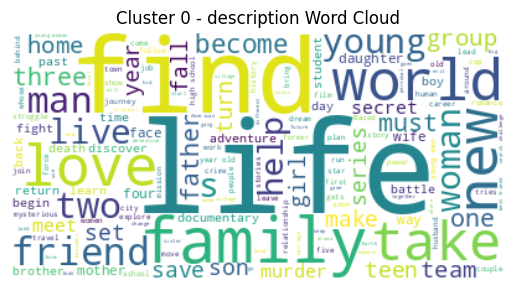

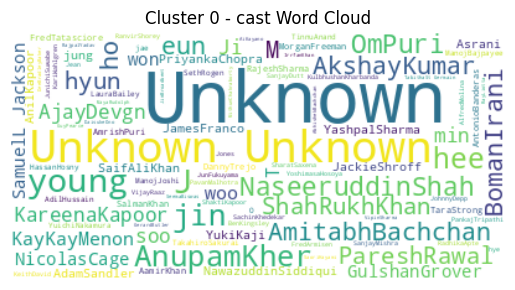

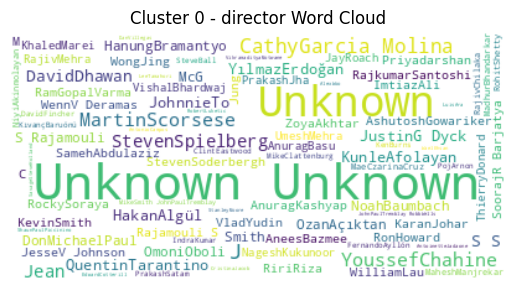

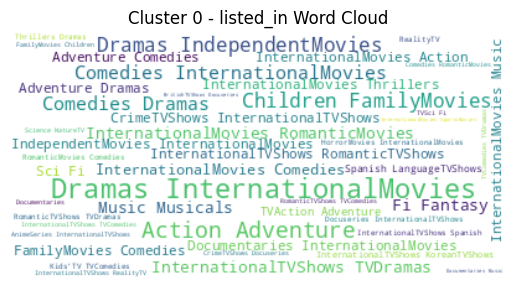

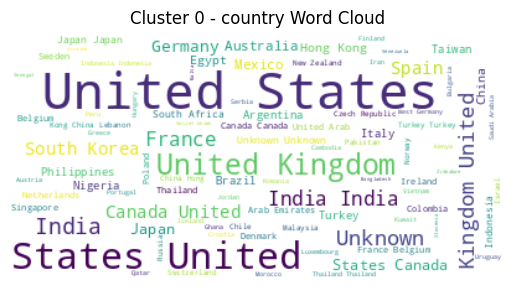

...

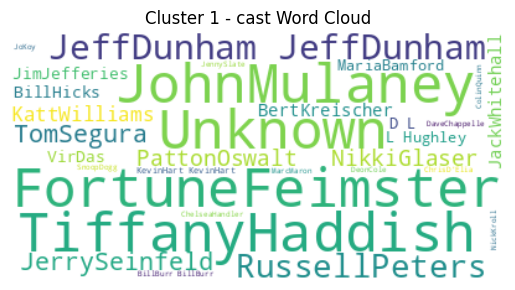

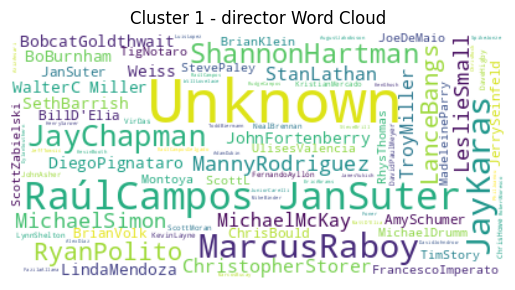

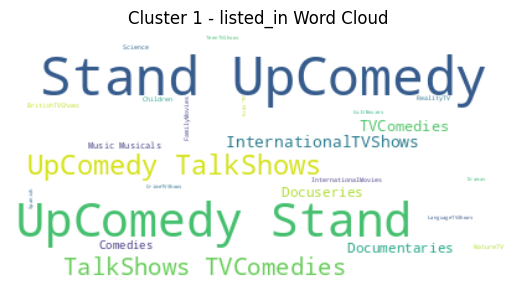

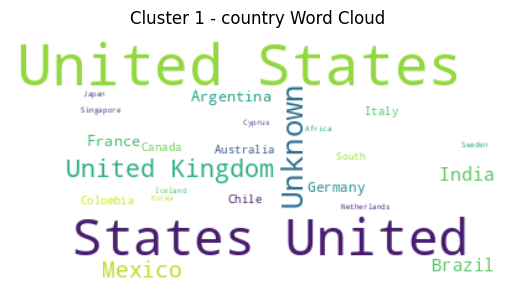

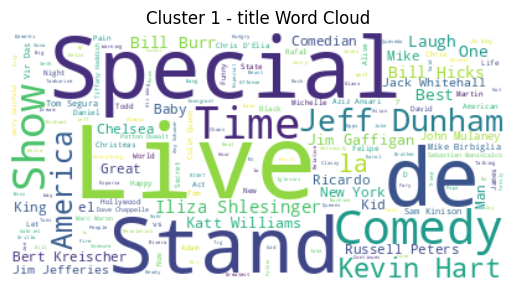

In [ ]:
# Function to generate word cloud for a specific cluster and column
def generate_wordcloud(cluster, column):
    # Filter the dataframe for the specific cluster
    df2_cluster = df2[df2['Agglo_clusters'] == cluster]

    # Concatenate the text from the selected column
    text = " ".join(word for word in df2_cluster[column])

    # Create stopword list
    stopwords = set(STOPWORDS)

    # Generate the word cloud
    wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(text)

    # Display the word cloud
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.title(f"Cluster {cluster} - {column} Word Cloud")
    plt.show()

# Generate word clouds for each cluster and column
clusters = df2['Agglo_clusters'].unique()
columns = ['description', 'cast', 'director', 'listed_in', 'country', 'title']

for cluster in clusters:
    for column in columns:
        generate_wordcloud(cluster, column)


In [ ]:
u_labels = np.unique(df2['Agglo_clusters'])
data = []
for i in u_labels:
    data.append(go.Scatter3d(
        x=X[df2['Agglo_clusters'] == i, 0],
        y=X[df2['Agglo_clusters'] == i, 1],
        z=X[df2['Agglo_clusters'] == i, 2],
        mode='markers',
        marker=dict(
            size=5,
            color=i,
            colorscale='Viridis',
            opacity=0.8
        ),
        name='Cluster {}'.format(i)
    ))

layout = go.Layout(
    title='Agglomerative Clustering Results (3D)',
    scene=dict(
        xaxis=dict(title='X'),
        yaxis=dict(title='Y'),
        zaxis=dict(title='Z')
    )
)

fig = go.Figure(data=data, layout=layout)
fig.show()


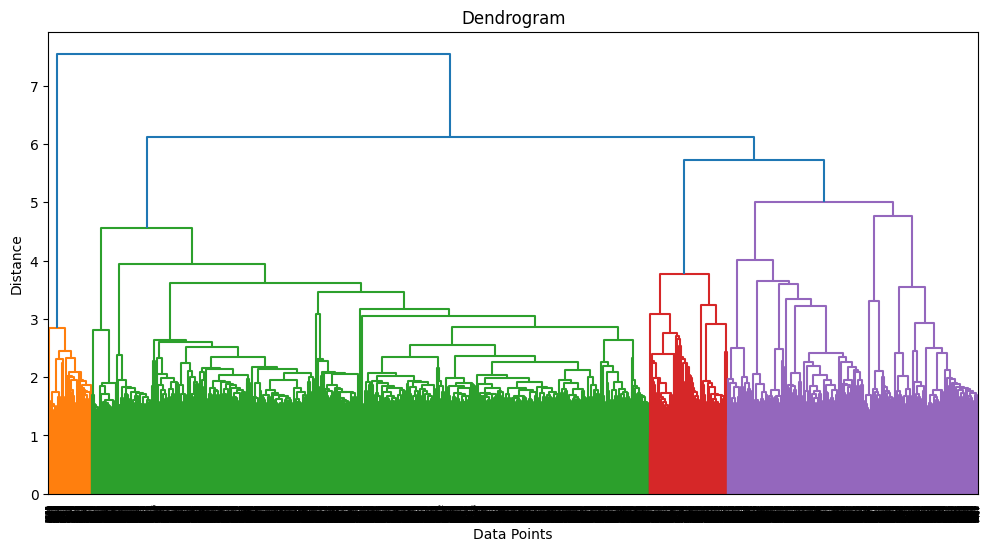

In [ ]:
import scipy.cluster.hierarchy as sch

# Compute the linkage matrix
linkage_matrix = sch.linkage(X_transformed, method='ward')

# Plot the dendrogram
plt.figure(figsize=(12, 6))
sch.dendrogram(linkage_matrix)
plt.title('Dendrogram')
plt.xlabel('Data Points')
plt.ylabel('Distance')
plt.show()


#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

Hierarchical clustering is a machine learning model for unsupervised learning tasks, forming a hierarchy of clusters based on feature similarities. A score chart can be created to evaluate the model's performance using multiple metrics. By analyzing the score chart, the best-performing hierarchical clustering model can be identified, allowing for a comprehensive understanding of the model's performance.

In [ ]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
# Compute silhouette score
silhouette = silhouette_score(X_transformed, df2['Agglo_clusters'])

# Compute Calinski-Harabasz score
calinski_harabasz = calinski_harabasz_score(X_transformed, df2['Agglo_clusters'])

# Compute Davies-Bouldin score
davies_bouldin = davies_bouldin_score(X_transformed, df2['Agglo_clusters'])

# Display the evaluation metrics
print("Silhouette Score: ", silhouette)
print("Calinski-Harabasz Score: ", calinski_harabasz)
print("Davies-Bouldin Score: ", davies_bouldin)


Silhouette Score:  0.0057511016529987365
Calinski-Harabasz Score:  31.955839165659924
Davies-Bouldin Score:  6.489153469912955


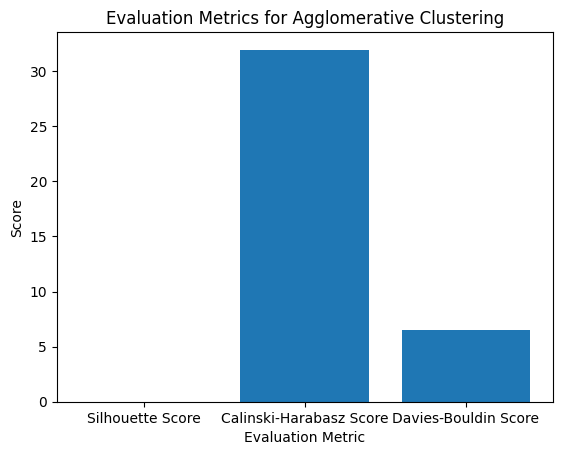

In [ ]:
# Define the evaluation metrics
metrics = ['Silhouette Score', 'Calinski-Harabasz Score', 'Davies-Bouldin Score']
scores = [silhouette, calinski_harabasz, davies_bouldin]

# Create a bar chart
plt.bar(metrics, scores)
plt.xlabel('Evaluation Metric')
plt.ylabel('Score')
plt.title('Evaluation Metrics for Agglomerative Clustering')

# Display the chart
plt.show()


 The combination of these scores suggests that while there might be some overlap or ambiguity in the clustering results (indicated by the Silhouette score and Davies-Bouldin score), the clusters still exhibit a certain degree of separation and distinctiveness (indicated by the Calinski-Harabasz score). It's important to interpret these scores in conjunction with other contextual information and domain knowledge to gain a comprehensive understanding of the clustering performance.

### Which ML model did you choose from the above created models as your final prediction model and why?

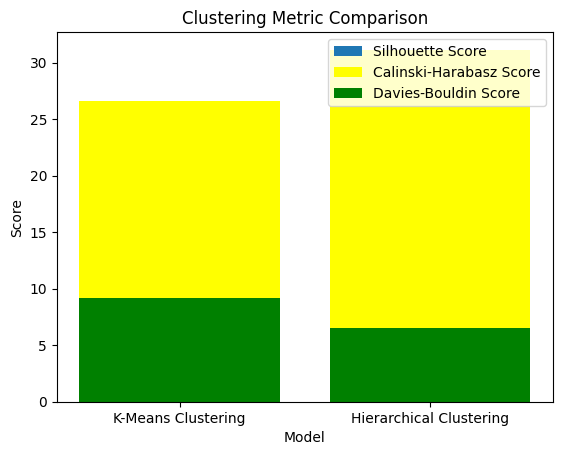

In [ ]:
# Storing metrics in order to make dataframe of metrics
Model = ['K-Means Clustering', 'Hierarchical Clustering']
S_score  = [0.0088, 0.00567]
CH_score = [26.623166, 31.13439]
DB_score = [9.18570, 6.49611]
No_of_cluster = [9, 2]
# Create dataframe from the lists
data = {'Model' : Model,
        'Number of clusters': No_of_cluster,
        'silhouette_score'  : S_score,
        'calinski_harabasz_score': CH_score,
        'davies_bouldin_score': DB_score}
Metric_df = pd.DataFrame(data)

plt.bar(Model, S_score, label='Silhouette Score')
plt.bar(Model, CH_score, label='Calinski-Harabasz Score', color='yellow')
plt.bar(Model, DB_score, label='Davies-Bouldin Score', color='green')

plt.xlabel('Model')
plt.ylabel('Score')
plt.title('Clustering Metric Comparison')

plt.legend()
plt.show()

Taking all of these assessment factors into consideration, Hierarchical Clustering appears as the best option. Its higher Calinski-Harabasz score implies stronger cluster separation, while its lower Davies-Bouldin score shows well-defined clusters with less overlap. While K-Means Clustering has a higher silhouette score, Hierarchical Clustering has a better overall performance.

### ***Congrats! Your model is successfully created and ready for deployment on a live server for a real user interaction !!!***